## Perform clustering (hierarchical,K means clustering and DBSCAN) for the airlines data to obtain optimum number of clusters. 
Draw the inferences from the clusters obtained.

Data Description:
 
The file EastWestAirlines contains information on passengers who belong to an airline’s frequent flier program. For each passenger the data include information on their mileage history and on different ways they accrued or spent miles in the last year. The goal is to try to identify clusters of passengers that have similar characteristics for the purpose of targeting different segments for different types of mileage offers

ID --Unique ID

Balance--Number of miles eligible for award travel

Qual_mile--Number of miles counted as qualifying for Topflight status

cc1_miles -- Number of miles earned with freq. flyer credit card in the past 12 months:
cc2_miles -- Number of miles earned with Rewards credit card in the past 12 months:
cc3_miles -- Number of miles earned with Small Business credit card in the past 12 months:

1 = under 5,000
2 = 5,000 - 10,000
3 = 10,001 - 25,000
4 = 25,001 - 50,000
5 = over 50,000

Bonus_miles--Number of miles earned from non-flight bonus transactions in the past 12 months

Bonus_trans--Number of non-flight bonus transactions in the past 12 months

Flight_miles_12mo--Number of flight miles in the past 12 months

Flight_trans_12--Number of flight transactions in the past 12 months

Days_since_enrolled--Number of days since enrolled in flier program

Award--whether that person had award flight (free flight) or not


 

In [1]:
import os
os.getcwd()

'C:\\Users\\DELL\\Data Science\\Abhishek ExcelR\\Data Science\\Assignments\\Clustering'

# Load the DataSet and Necessary Libraries

In [32]:
#Importing necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn import preprocessing
from dataprep.eda import plot_missing,plot_correlation,plot_diff,create_report,plot
import seaborn as sn

import matplotlib.cm as cm
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
import scipy.cluster.hierarchy as sch
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from yellowbrick.cluster import KElbowVisualizer

from sklearn.metrics import silhouette_score as sil , calinski_harabasz_score as chs, silhouette_samples



In [3]:
#from autoviz.AutoViz_Class import AutoViz_Class

#AV = AutoViz_Class()

In [4]:

#filename="EastWestAirlines.xlsx"
#dft=AV.AutoViz(filename)

In [5]:
#Load the dataset

data=pd.read_excel('EastWestAirlines.xlsx')

pd.set_option('display.max_rows', None)


In [6]:
#View the data
data

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [7]:
# Column rename.
data.rename(columns={'ID#':'ID', 'Award?':'Award'}, inplace=True)

#Set ID as Index Column
data.set_index('ID',inplace=True)
data

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
ID,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0
2,19244,0,1,1,1,215,2,0,0,6968,0
3,41354,0,1,1,1,4123,4,0,0,7034,0
4,14776,0,1,1,1,500,1,0,0,6952,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...
4017,18476,0,1,1,1,8525,4,200,1,1403,1
4018,64385,0,1,1,1,981,5,0,0,1395,1
4019,73597,0,3,1,1,25447,8,0,0,1402,1


# Data Exploration

In [8]:
# Checking dataset types, datatypes

data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3999 entries, 1 to 4021
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   Balance            3999 non-null   int64
 1   Qual_miles         3999 non-null   int64
 2   cc1_miles          3999 non-null   int64
 3   cc2_miles          3999 non-null   int64
 4   cc3_miles          3999 non-null   int64
 5   Bonus_miles        3999 non-null   int64
 6   Bonus_trans        3999 non-null   int64
 7   Flight_miles_12mo  3999 non-null   int64
 8   Flight_trans_12    3999 non-null   int64
 9   Days_since_enroll  3999 non-null   int64
 10  Award              3999 non-null   int64
dtypes: int64(11)
memory usage: 374.9 KB


In [9]:
# Descriptive statistics
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Balance,3999.0,73601.327582,100775.664958,0.0,18527.5,43097.0,92404.0,1704838.0
Qual_miles,3999.0,144.114529,773.663804,0.0,0.0,0.0,0.0,11148.0
cc1_miles,3999.0,2.059515,1.376919,1.0,1.0,1.0,3.0,5.0
cc2_miles,3999.0,1.014504,0.147650,1.0,1.0,1.0,1.0,3.0
cc3_miles,3999.0,1.012253,0.195241,1.0,1.0,1.0,1.0,5.0
Bonus_miles,3999.0,17144.846212,24150.967826,0.0,1250.0,7171.0,23800.5,263685.0
Bonus_trans,3999.0,11.601900,9.603810,0.0,3.0,12.0,17.0,86.0
Flight_miles_12mo,3999.0,460.055764,1400.209171,0.0,0.0,0.0,311.0,30817.0
Flight_trans_12,3999.0,1.373593,3.793172,0.0,0.0,0.0,1.0,53.0
Days_since_enroll,3999.0,4118.559390,2065.134540,2.0,2330.0,4096.0,5790.5,8296.0


In [10]:
# Find duplicated rows
data.duplicated().sum()

1

In [11]:
data[data.duplicated()]


,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
ID,,,,,,,,,,,
3899,1000,0,1,1,1,0,0,0,0,1597,0


In [37]:
#We drop duplicat row
data.drop_duplicates(inplace=True)

In [39]:
data[data.duplicated()]
#As we can see there is no duplicates 

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
ID,,,,,,,,,,,


In [40]:
# Find missing values
data.isna().sum()

Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award                0
dtype: int64

In [41]:
# Find null values
data.isnull().sum()

Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award                0
dtype: int64

In [42]:
# Different cc_miles have diff max values.So, we check that values.

print('Unique values of cc1_miles: ',data['cc1_miles'].unique())
print('Unique values of cc2_miles: ',data['cc2_miles'].unique())
print('Unique values of cc3_miles: ',data['cc3_miles'].unique())



Unique values of cc1_miles:  [1 4 3 2 5]
Unique values of cc2_miles:  [1 2 3]
Unique values of cc3_miles:  [1 3 2 4 5]


  0%|                                                                                         | 0/1741 [00:00<…

DataPrep Report
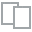
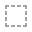
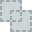
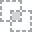
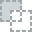
...
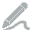
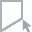
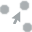
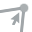
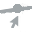

In [43]:
create_report(data)

As we can see from the above report :
    
1) There is no missing values in dataaset.

2) There is no duplicatesd rows in dataet.

3) There are 8 numerical and 4 categotical columns.

4)Following columns are uniformly skewed:
##### Balance, Qual_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12 is uniformly skewed

5)In the following columns there more zeros:
Qual_miles has 3773 (94.35%) zeros,
Bonus_miles has 475 (11.88%) zeros,
Bonus_trans has 475 (11.88%) zeros,Flight_miles_12mo has 2723 (68.09%) zeros,
Flight_trans_12 has 2723 (68.09%)zeros


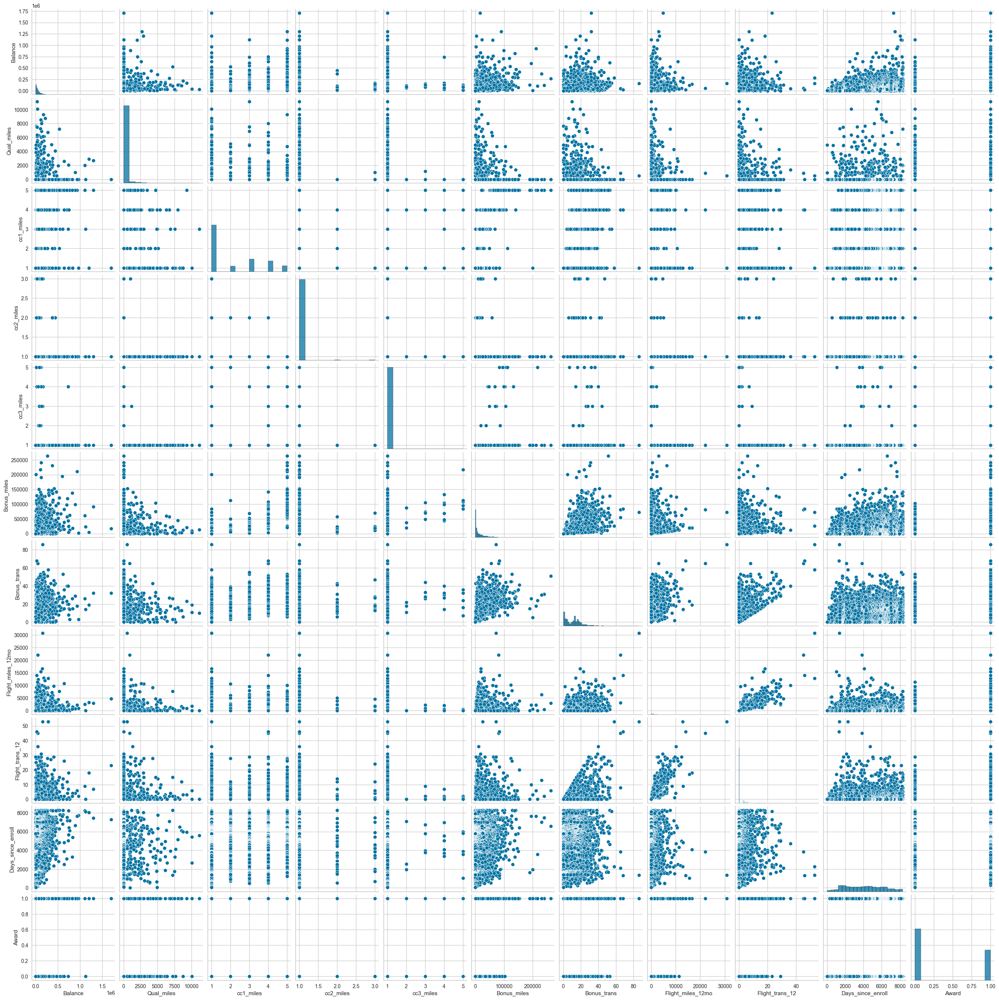

In [44]:
# lot the pairplot for find correlation
df=data.copy()
sn.pairplot(df)

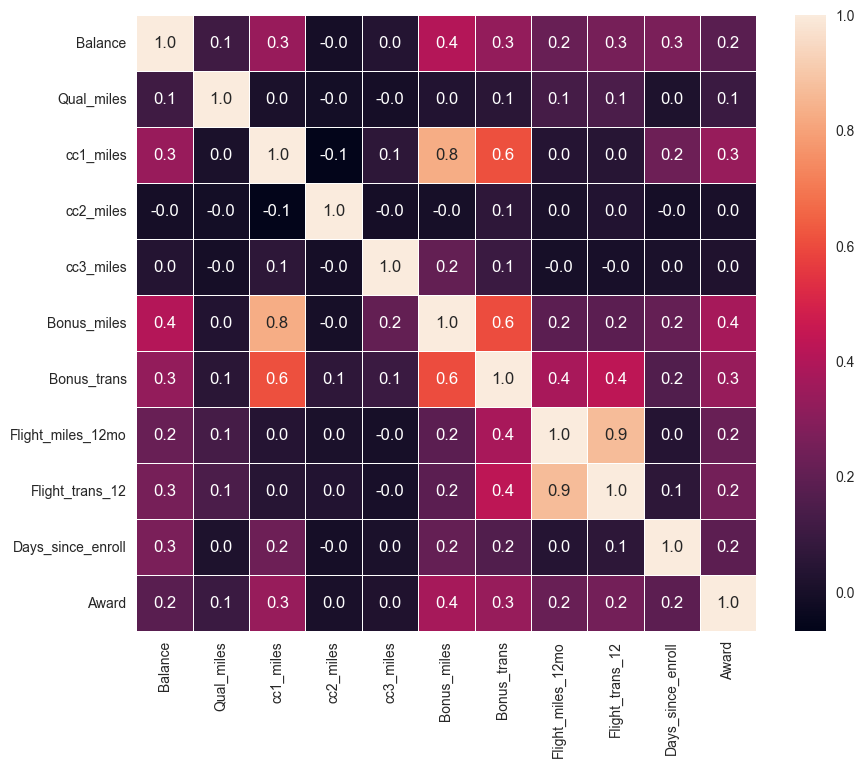

In [45]:
f,ax = plt.subplots(figsize=(10,8))
sn.heatmap(data.corr(), annot=True, linewidths =.5, fmt ='.1f',ax=ax)
plt.show()

#### As we can see that,Unique points in this correlation matrix:

1)flight_trans_12 is positively correlated with flight_miles_12mo(0.9)

2)bonus_trans is positively correlated with cc1_miles(0.6)

3)bonus_trans is positively correlated with bonus_miles(0.8)

4)bonus_miles is positively correlated with cc1_miles(0.6)

#### In other words, the following are positively correlated

Number of flight transactions in the past 12 months = Number of flight miles in the past 12 months

Miles passengers earn with the freq. flyer credit card = Amount of non-flight transactions

Number of non-flight bonus transactions = Miles passengers earn from non-flight bonus transactions

Miles passengers earn from non-flight bonus transactions = Miles passengers earn with the freq. flyer credit card

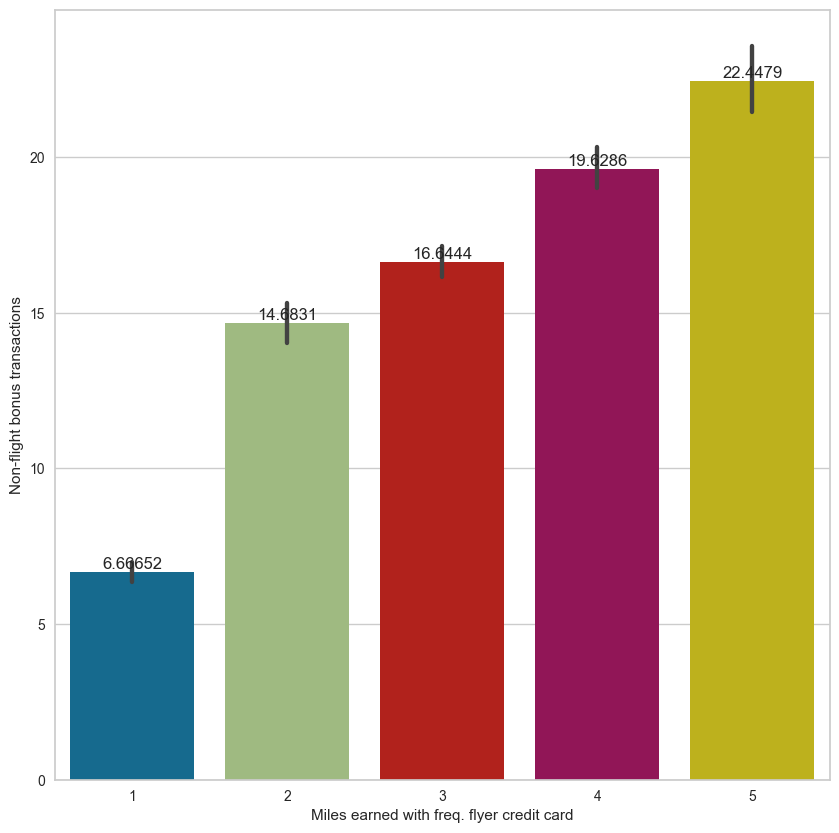

In [46]:
# Plotting frequent flying bonuses vs. non-flight bonus transactions 
plt.figure(figsize = (10,10))

sorted_data = df[['cc1_miles','Bonus_trans']].sort_values('Bonus_trans', ascending = False)
ax = sn.barplot(x='cc1_miles', y='Bonus_trans', data= sorted_data)
ax.set(xlabel = 'Miles earned with freq. flyer credit card',
       ylabel= 'Non-flight bonus transactions')

for i in ax.containers:
    ax.bar_label(i,)
    
plt.xticks(rotation=0)
plt.show()

##### From the above barplot we can say that,People who fly more frequently use bonus transactions more.

## Outlier Detection

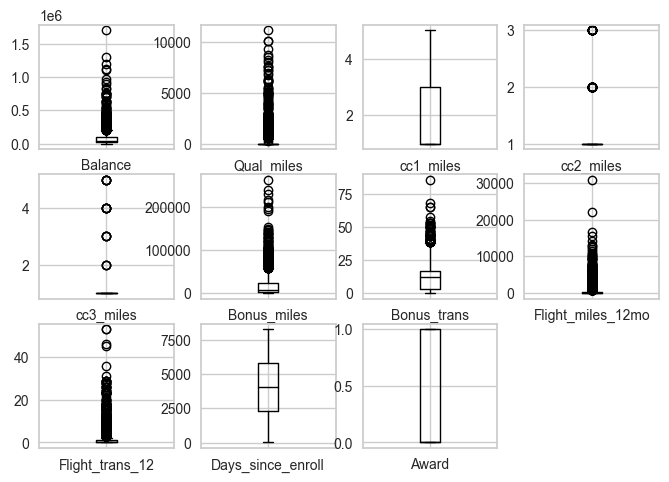

In [47]:
df.plot( kind = 'box', subplots = True, layout = (3,4), sharex = False, sharey = False,color='black')
plt.show()

<AxesSubplot: >

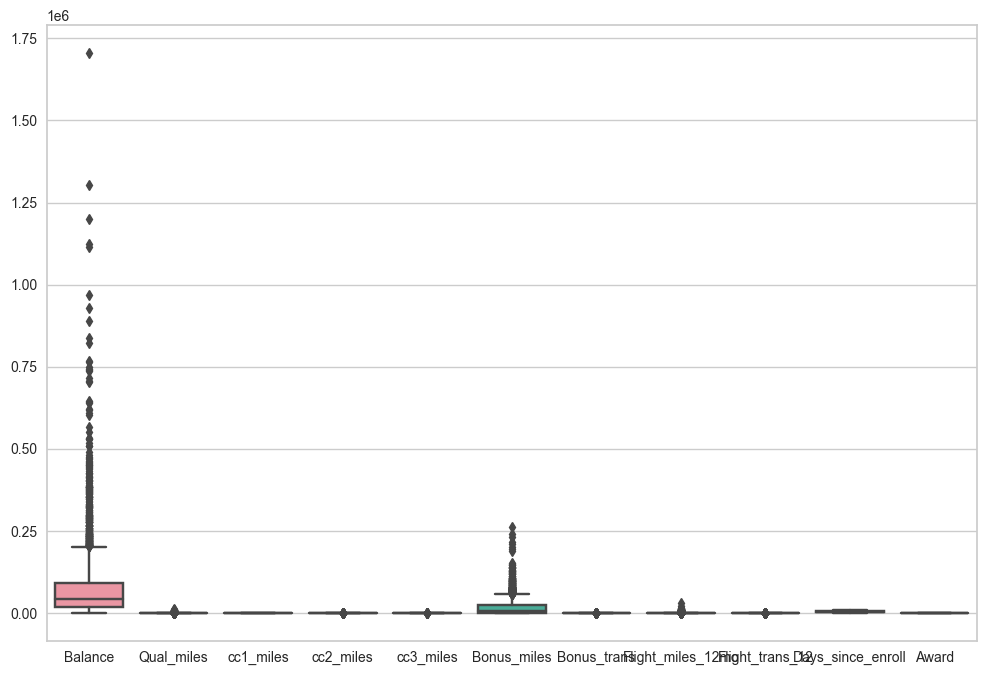

In [48]:
plt.figure(figsize=(12,8))
sn.boxplot(data=df)


<AxesSubplot: >

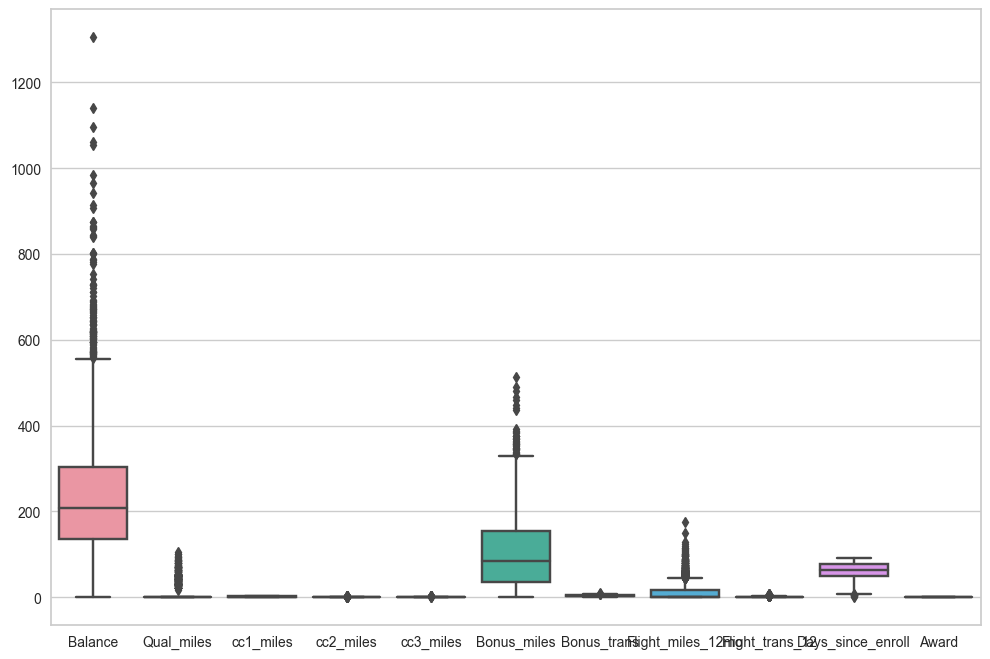

In [49]:
# we use sqrt() to see more clearly despite the outliers

plt.figure(figsize=(12,8))
sn.boxplot(data=np.sqrt(df))

As we see in the above 3 plots for outlier detection :
There is more outliers in quant miles, balance ,bonusmiles
#### So , we do standardisation for better output

### Standardisation

### Using standard scalar method:

In [50]:
standard_scaler = StandardScaler()
std_df = standard_scaler.fit_transform(df)
std_df.shape

(3998, 11)

#### Normalizing the data
 Using Minmaxscaler for accuracy result comparison


In [51]:
minmax = MinMaxScaler()

minmax_df = minmax.fit_transform(df)
minmax_df.shape

(3998, 11)

In [52]:
df.columns

Index(['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'Award'],
      dtype='object')

In [53]:
min=pd.DataFrame(data=minmax_df,columns=['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'Award'])
min

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
0,0.016508,0.0,0.00,0.0,0.0,0.000660,0.011628,0.000000,0.000000,0.843742,0.0
1,0.011288,0.0,0.00,0.0,0.0,0.000815,0.023256,0.000000,0.000000,0.839884,0.0
2,0.024257,0.0,0.00,0.0,0.0,0.015636,0.046512,0.000000,0.000000,0.847842,0.0
3,0.008667,0.0,0.00,0.0,0.0,0.001896,0.011628,0.000000,0.000000,0.837955,0.0
4,0.057338,0.0,0.75,0.0,0.0,0.164211,0.302326,0.067398,0.075472,0.835905,1.0
...,...,...,...,...,...,...,...,...,...,...,...
3993,0.010837,0.0,0.00,0.0,0.0,0.032330,0.046512,0.006490,0.018868,0.168917,1.0
3994,0.037766,0.0,0.00,0.0,0.0,0.003720,0.058140,0.000000,0.000000,0.167953,1.0
3995,0.043169,0.0,0.50,0.0,0.0,0.096505,0.093023,0.000000,0.000000,0.168797,1.0
3996,0.032202,0.0,0.00,0.0,0.0,0.001896,0.011628,0.016225,0.018868,0.168676,0.0


## Running PCA of standardized data.
 applying PCA on std_df

we are considering 95% variance in n_components to not loose any data.



In [54]:
from sklearn.decomposition import PCA
pca_std = PCA(random_state=10, n_components=0.95)
pca_std_df= pca_std.fit_transform(std_df)

In [55]:
# eigenvalues..

print(pca_std.singular_values_)

[114.59929366  83.12095737  64.93711956  63.52257567  61.95910679
  60.39325992  56.7960262   49.8137685   37.95289819]


In [56]:
# variance containing in each formed PCA

print(pca_std.explained_variance_ratio_*100)


[29.8626543  15.71034052  9.58849765  9.17530952  8.72920759  8.29356916
  7.33500521  5.64239286  3.27532512]


In [57]:
# Cummulative variance ratio..

# this will give an idea of, at how many no. of PCAs, the cummulative addition ofvariance will give much information..

cum_variance = np.cumsum(pca_std.explained_variance_ratio_*100)
cum_variance

array([29.8626543 , 45.57299482, 55.16149247, 64.33680198, 73.06600957,
       81.35957873, 88.69458394, 94.3369768 , 97.61230192])

##### Conclusion:
By applying PCA on standardized data with 95% variance it gives 9 PCA components.

#### Silhouette Score method for PCA Standard Scaled Data

In [59]:
n_clusters = [2,3,4,5,6,7,8,9,10]  # always start number from 2.

for n_clusters in n_clusters:
    for linkages in ["ward", "complete", "average", "single"]:
        hie_cluster1 = AgglomerativeClustering(n_clusters=n_clusters,linkage=linkages) # bydefault it takes linkage 'ward'
        hie_labels1 = hie_cluster1.fit_predict(pca_std_df)
        silhouette_score1 = sil(pca_std_df, hie_labels1)
        print("For n_clusters =", n_clusters,"The average silhouette_score with linkage-",linkages, ':',silhouette_score1)
    print()

For n_clusters = 2 The average silhouette_score with linkage- ward : 0.1996139051729071
For n_clusters = 2 The average silhouette_score with linkage- complete : 0.8108617312271154
For n_clusters = 2 The average silhouette_score with linkage- average : 0.8108617312271154
For n_clusters = 2 The average silhouette_score with linkage- single : 0.738309454714575

For n_clusters = 3 The average silhouette_score with linkage- ward : 0.21104413292128157
For n_clusters = 3 The average silhouette_score with linkage- complete : 0.7783994853820995
For n_clusters = 3 The average silhouette_score with linkage- average : 0.7857918595410374
For n_clusters = 3 The average silhouette_score with linkage- single : 0.7380319163788157

For n_clusters = 4 The average silhouette_score with linkage- ward : 0.2149786632607184
For n_clusters = 4 The average silhouette_score with linkage- complete : 0.6685293540610889
For n_clusters = 4 The average silhouette_score with linkage- average : 0.775442673464243
For n_

### PCA in Minmax Scalar data

In [120]:
pca_min = PCA(random_state=10, n_components=0.95)
pca_minmax_df= pca_min.fit_transform(minmax_df)

In [121]:
# eigenvalues..

print(pca_min.singular_values_)

[32.61283384 20.38274997 14.94964196  6.55127594]


In [122]:
# variance containing in each formed PCA

print(pca_min.explained_variance_ratio_*100)


[58.10519044 22.69673608 12.20954379  2.34471271]



By applying PCA on MinMaxscalar transformation data gives 4 PCA components.

#### Silhouette Score method for PCA MinMax Scaled Data

In [123]:
n_clusters = [2,3,4,5,6,7,8]  # always start number from 2.

for n_clusters in n_clusters:
    for linkages in ["ward", "complete", "average", "single"]:
        hie_cluster2 = AgglomerativeClustering(n_clusters=n_clusters,linkage=linkages) # bydefault it takes linkage 'ward'
        hie_labels2 = hie_cluster2.fit_predict(pca_minmax_df)
        silhouette_score2 = sil(pca_minmax_df, hie_labels2)
        print("For n_clusters =", n_clusters,"The average silhouette_score with linkage-",linkages, ':',silhouette_score2)
    print()

For n_clusters = 2 The average silhouette_score with linkage- ward : 0.557020311332076
For n_clusters = 2 The average silhouette_score with linkage- complete : 0.45062835604506807
For n_clusters = 2 The average silhouette_score with linkage- average : 0.4746720886833246
For n_clusters = 2 The average silhouette_score with linkage- single : 0.557020311332076

For n_clusters = 3 The average silhouette_score with linkage- ward : 0.46680187576896975
For n_clusters = 3 The average silhouette_score with linkage- complete : 0.5527079342536563
For n_clusters = 3 The average silhouette_score with linkage- average : 0.5545201621845232
For n_clusters = 3 The average silhouette_score with linkage- single : 0.5557695658754247

For n_clusters = 4 The average silhouette_score with linkage- ward : 0.4605211923296595
For n_clusters = 4 The average silhouette_score with linkage- complete : 0.509491332840777
For n_clusters = 4 The average silhouette_score with linkage- average : 0.49792940443545286
For n

# Hierarchial Clustering

Hierarchical clustering is a type of unsupervised machine learning 
algorithm used to cluster unlabeled data points. 
Like K-means clustering, hierarchical clustering also groups together the data points with similar characteristics.The output will results in an inverted tree-shaped structure, called the dendrogram.

Types Of Hierarchical Clustering:
1)Agglomerative[bottom-up approach],2)Divisive[Top-down approach]

##### The key operation in hierarchical agglomerative clustering is to repeatedly combine the two nearest clusters into a larger cluster.

### Dendogram on MinMaxScaler Applied on Dataset

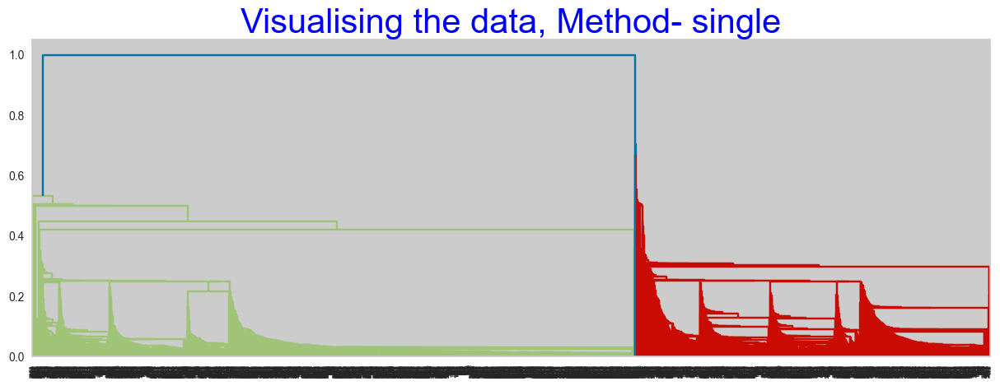

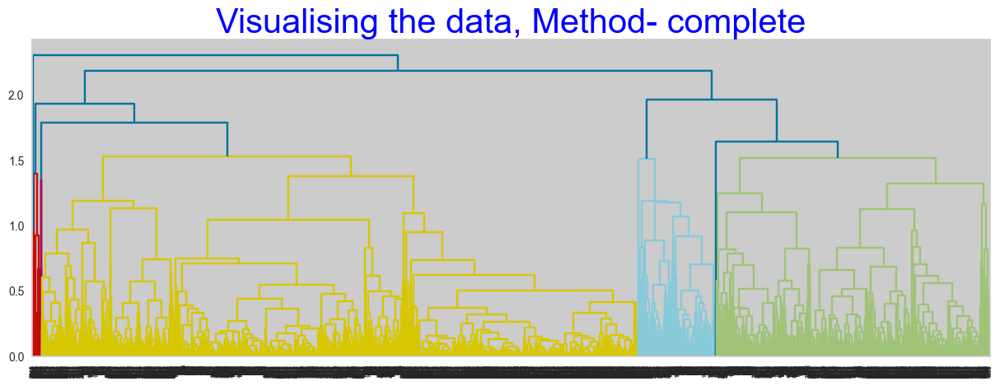

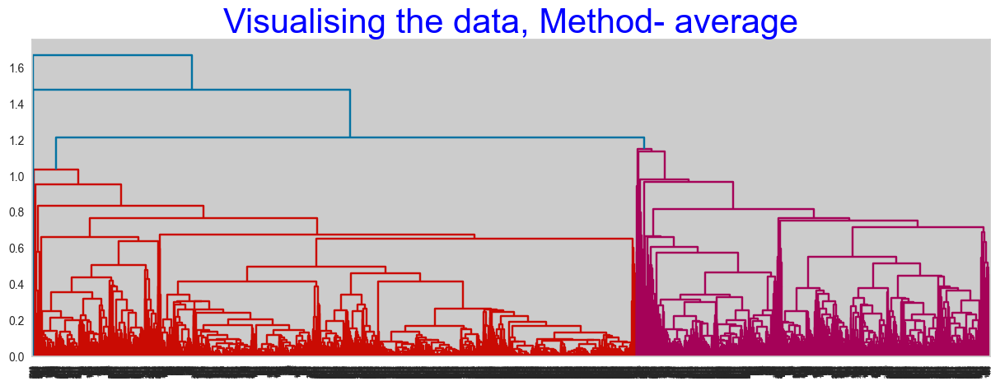

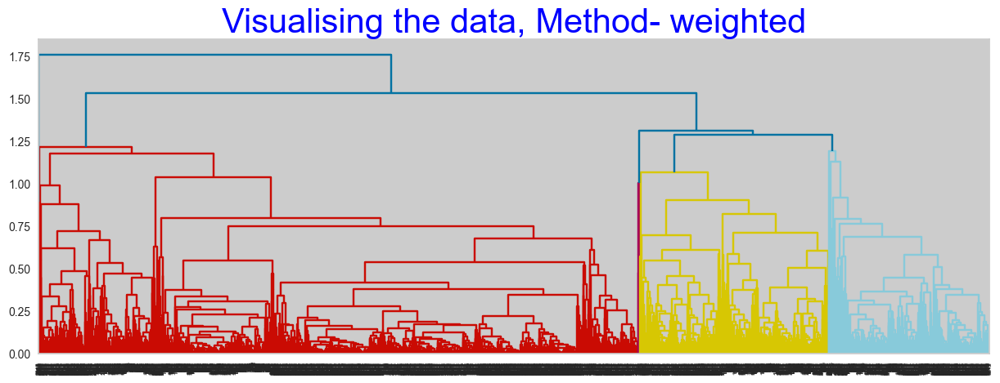

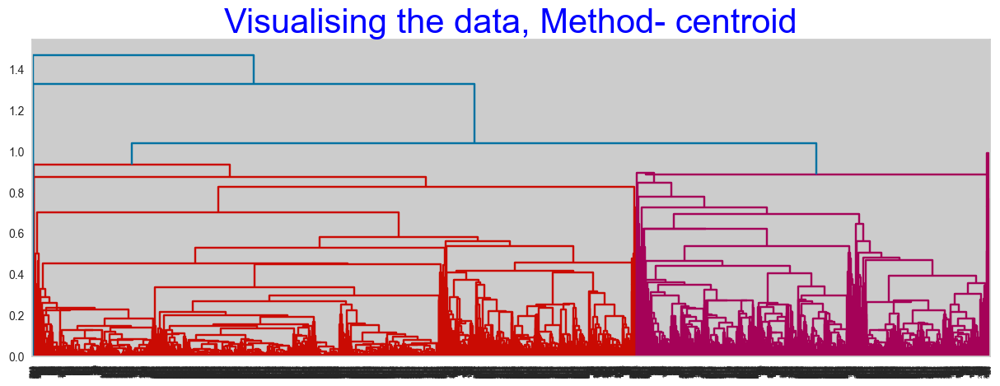

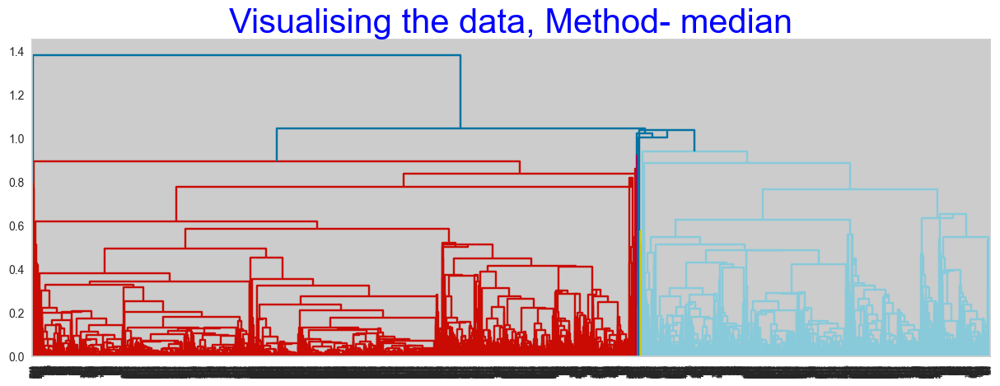

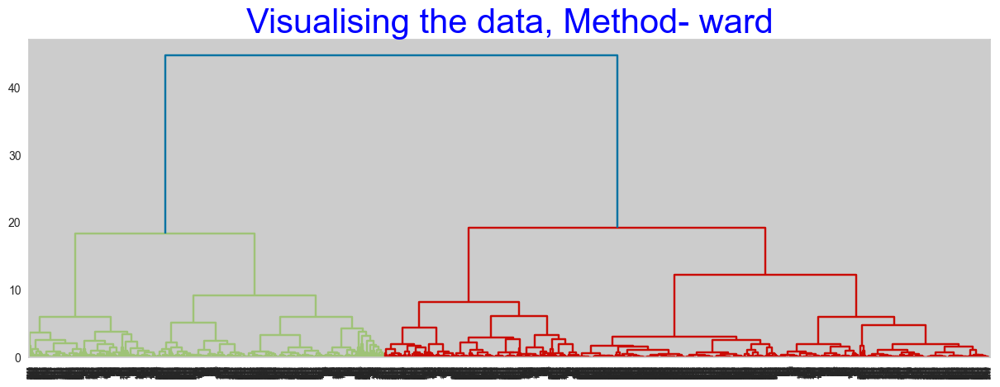

In [60]:
for methods in ['single','complete','average','weighted','centroid','median','ward']: 
    plt.figure(figsize =(15, 5)) 
    
    dict = {'fontsize':30,'fontweight' :18, 'color' : 'blue'}
    
    plt.title('Visualising the data, Method- {}'.format(methods),
              fontdict = dict) 
    
    Dendrogram1 = sch.dendrogram(sch.linkage(minmax_df, 
                                             method = methods,
                                             optimal_ordering=False))


In [61]:
n_clusters = [2,3,4,5,6,7,8]  # always start number from 2.

for n_clusters in n_clusters:
    for linkages in ["ward", "complete", "average", "single"]:
        hie_cluster1 = AgglomerativeClustering(n_clusters=n_clusters,linkage=linkages) # bydefault it takes linkage 'ward'
        hie_labels1 = hie_cluster1.fit_predict(minmax_df)
        silhouette_score1 = sil(minmax_df, hie_labels1)
        print("For n_clusters =", n_clusters,"The average silhouette_score with linkage-",linkages, ':',silhouette_score1)
    print()

For n_clusters = 2 The average silhouette_score with linkage- ward : 0.535888544052936
For n_clusters = 2 The average silhouette_score with linkage- complete : 0.4703657329091562
For n_clusters = 2 The average silhouette_score with linkage- average : 0.4703657329091562
For n_clusters = 2 The average silhouette_score with linkage- single : 0.535888544052936

For n_clusters = 3 The average silhouette_score with linkage- ward : 0.4354523188194701
For n_clusters = 3 The average silhouette_score with linkage- complete : 0.5318364582439801
For n_clusters = 3 The average silhouette_score with linkage- average : 0.3961439228235289
For n_clusters = 3 The average silhouette_score with linkage- single : 0.5351186081149816

For n_clusters = 4 The average silhouette_score with linkage- ward : 0.42489181550394106
For n_clusters = 4 The average silhouette_score with linkage- complete : 0.4645451427805366
For n_clusters = 4 The average silhouette_score with linkage- average : 0.5285595526639542
For n_

##### The seperation in Ward Method indicate that 2 is the optimal number for clusters.
Ward method is actually a method that tries to minimize the variance within each cluster. 

### Dendrogram on Standard Scaler Applied on Data

In [62]:
n_clusters = [2,3,4,5,6,7,8,9,10]  # always start number from 2.

for n_clusters in n_clusters:
    for linkages in ["ward", "complete", "average", "single"]:
        hie_cluster1 = AgglomerativeClustering(n_clusters=n_clusters,linkage=linkages) # bydefault it takes linkage 'ward'
        hie_labels1 = hie_cluster1.fit_predict(std_df)
        silhouette_score1 = sil(std_df, hie_labels1)
        print("For n_clusters =", n_clusters,"The average silhouette_score with linkage-",linkages, ':',silhouette_score1)
    print()

For n_clusters = 2 The average silhouette_score with linkage- ward : 0.2891560488062143
For n_clusters = 2 The average silhouette_score with linkage- complete : 0.8110876003700274
For n_clusters = 2 The average silhouette_score with linkage- average : 0.8110876003700274
For n_clusters = 2 The average silhouette_score with linkage- single : 0.8562622335599249

For n_clusters = 3 The average silhouette_score with linkage- ward : 0.2939395016802131
For n_clusters = 3 The average silhouette_score with linkage- complete : 0.7760498283333268
For n_clusters = 3 The average silhouette_score with linkage- average : 0.7838424148089893
For n_clusters = 3 The average silhouette_score with linkage- single : 0.7350131896585496

For n_clusters = 4 The average silhouette_score with linkage- ward : 0.308036175465823
For n_clusters = 4 The average silhouette_score with linkage- complete : 0.5985292155693238
For n_clusters = 4 The average silhouette_score with linkage- average : 0.7730785441296635
For n_

##### Conclusion: 
    Max score is with cluster numbers 2 in standard scaler transformation and in Min Max scaler transformation.



In [129]:
agg_clustering = AgglomerativeClustering(n_clusters=2, linkage='ward')
y_pred_hie = agg_clustering.fit_predict(pca_minmax_df)
print(y_pred_hie.shape)
y_pred_hie


(3998,)


array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [130]:
# Cluster numbers

agg_clustering.n_clusters_

2

In [131]:
# Clustering Score

(sil(pca_minmax_df, agg_clustering.labels_)*100).round(3)


55.702

In [133]:
#Putting Cluster lables into original dataset And analysis of the same
# Concating Labels with main dataset copy

df['Hierarchical_labels'] = agg_clustering.labels_
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,KMeans_Label,Hierarchical_labels
ID,,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,1,0
2,19244,0,1,1,1,215,2,0,0,6968,0,1,0
3,41354,0,1,1,1,4123,4,0,0,7034,0,1,0
4,14776,0,1,1,1,500,1,0,0,6952,0,1,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4017,18476,0,1,1,1,8525,4,200,1,1403,1,0,1
4018,64385,0,1,1,1,981,5,0,0,1395,1,0,1
4019,73597,0,3,1,1,25447,8,0,0,1402,1,0,1


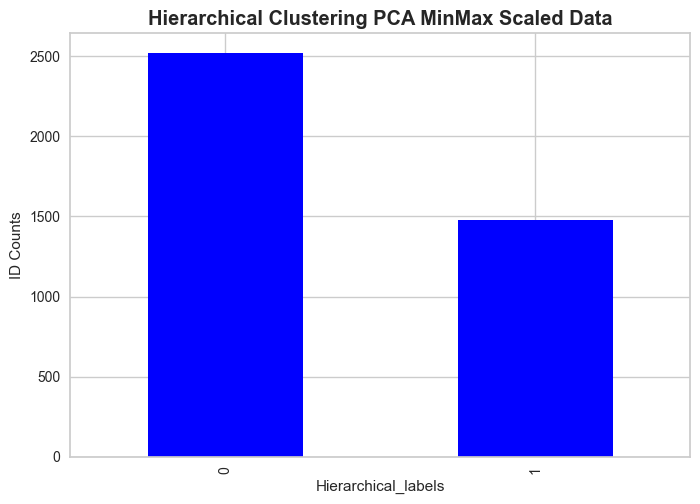

In [135]:
# Plotting barplot using groupby method to get visualize how many row no. in each cluster

df.groupby(['Hierarchical_labels']).count().plot(kind='bar',color='Blue',legend=False)
plt.ylabel('ID Counts')
plt.title('Hierarchical Clustering PCA MinMax Scaled Data',fontsize='large',fontweight='bold')
plt.show()

# K-Means Clustering

K-means is a centroid-based algorithm, or a distance-based algorithm, where we calculate the distances to assign a point to a cluster. In K-Means, each cluster is associated with a centroid.

The main objective of the K-Means algorithm is to minimize the sum of distances between the points and their respective cluster centroid. The first step in k-means is to pick the number of clusters, k. Then keep the iterations running until one of the below satisifes:

1)Centroids of newly formed clusters do not change.
2)Points remain in the same cluster.
3)Maximum number of iterations are reached.

In K Means clustering we need to first assign the K number of clusters which can be taken up using the thumb rule of "Sqrt(n)/2" or plotting the Elbow curve.


### Elbow Method for Determining Cluster Amount
### Standard Scaler Applied on Data

In [63]:
cluster_range = range(1,11)
cluster_errors = []
for num_clusters in cluster_range:
    clusters = KMeans(num_clusters,n_init=10)
    clusters.fit(std_df)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_
    cluster_errors.append(clusters.inertia_)
    
clusters_df = pd.DataFrame({"num_clusters":cluster_range,"cluster_errors":cluster_errors})
clusters_df

,num_clusters,cluster_errors
0,1,43978.000000
1,2,35402.340502
2,3,30893.140330
3,4,27156.284615
4,5,24879.143158
5,6,21086.128994
6,7,19527.431091
7,8,17366.428526
8,9,15964.568071
9,10,14728.905770


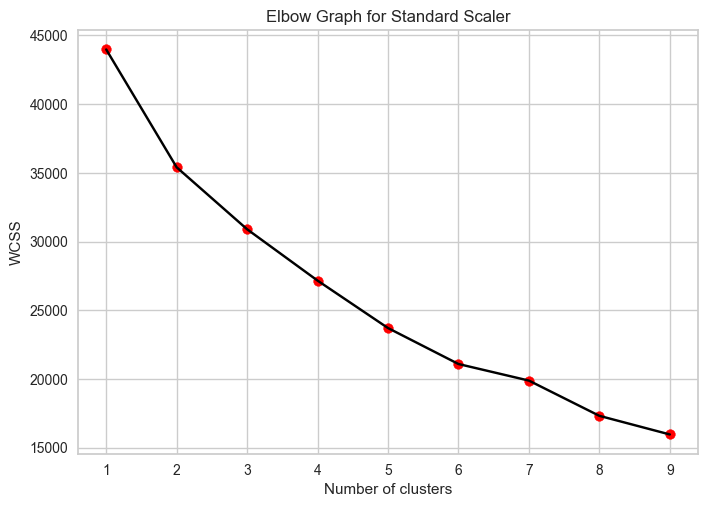

In [64]:
# within-cluster sum-of-squares criterion(wcss) 
# Use Elbow Graph to find optimum number of  clusters (K value) from K values range

wcss=[]
for i in range(1,10):
    kmeans=KMeans(n_clusters=i,random_state=42)
    kmeans.fit(std_df)
    wcss.append(kmeans.inertia_)
    
# Plot K values range vs WCSS to get Elbow graph for choosing K (no. of clusters)
plt.plot(range(1,10),wcss,color = 'black')
plt.scatter(range(1,10),wcss,color='red')
plt.title('Elbow Graph for Standard Scaler')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

There is no clear 'Elbow'visible in plot.So, we take 3 or 4 cluster to check silhouette score.

## Silhouette Score
### Silhouette coefficient

The silhouette analysis measures how well an observation is clustered and it estimates the average distance between clusters. The silhouette plot displays a measure of how close each point in one cluster is to points in the neighboring clusters.

In [65]:
n_clusters = [2,3,4,5,6,7,8,9,10] # number of clusters
clusters_inertia = [] # inertia of clusters
s_scores = [] # silhouette scores

for n in n_clusters:
    K_est = KMeans(n_clusters=n, init='k-means++').fit(std_df)
    # data for the elbow method
    clusters_inertia.append(K_est.inertia_)    
    silhouette_avg = silhouette_score(std_df, K_est.labels_)
     # data for the silhouette score method
    s_scores.append(silhouette_avg)

Elbow Plot for Standard Scaler data


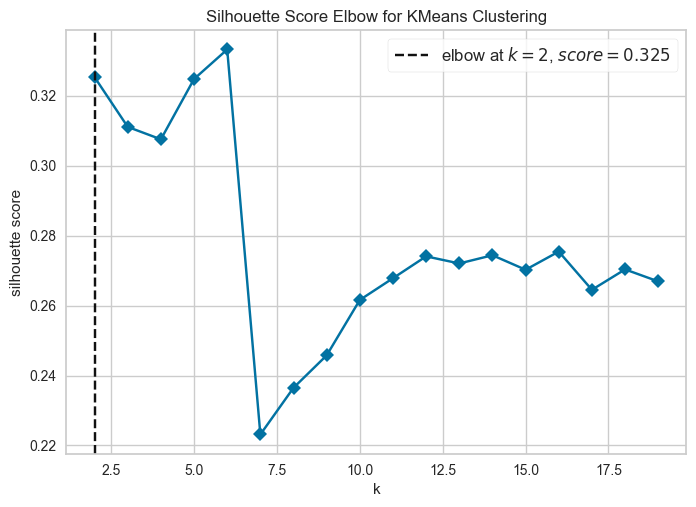

In [66]:
model = KMeans(random_state=42, max_iter=300, init='k-means++')

# Instantiate the KElbowVisualizer with the number of clusters and the metric
visualise = KElbowVisualizer(model, k=(2,20), 
                             
                             metric='silhouette', 
                             timings=False)

# Fit the data and visualize
print('Elbow Plot for Standard Scaler data')
visualise.fit(std_df)    
visualise.poof()
plt.show()

In [69]:
c_list=[2,3,4,5,6,7,8,9]
#sil score for minmax scalar Applied on data

for n_clusters in c_list:
    c1=KMeans(n_clusters=n_clusters,random_state=0)
    c_label1=c1.fit_predict(minmax_df)
    sil_score=sil(minmax_df,c_label1)
    print('For n_clusters: ',n_clusters,"The average silhoutte scorre is ",sil_score)

For n_clusters:  2 The average silhoutte scorre is  0.535888544052936
For n_clusters:  3 The average silhoutte scorre is  0.46479982811211207
For n_clusters:  4 The average silhoutte scorre is  0.47479527849897574
For n_clusters:  5 The average silhoutte scorre is  0.4429787795230887
For n_clusters:  6 The average silhoutte scorre is  0.4036935704266899
For n_clusters:  7 The average silhoutte scorre is  0.3902543534131159
For n_clusters:  8 The average silhoutte scorre is  0.3800928436109383
For n_clusters:  9 The average silhoutte scorre is  0.38422218036747746


For n_clusters = 2 The average silhouette_score is : 0.535888544052936
For n_clusters = 3 The average silhouette_score is : 0.46479982811211207
For n_clusters = 4 The average silhouette_score is : 0.47479527849897574
For n_clusters = 5 The average silhouette_score is : 0.4429787795230887
For n_clusters = 6 The average silhouette_score is : 0.40225452242902543
For n_clusters = 7 The average silhouette_score is : 0.3908365897205473
For n_clusters = 8 The average silhouette_score is : 0.379901520230827
For n_clusters = 9 The average silhouette_score is : 0.3413462044075975


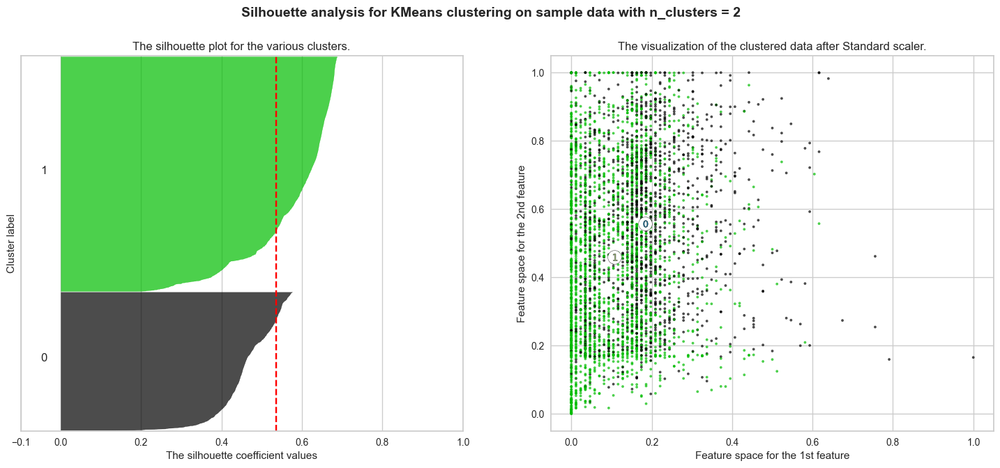

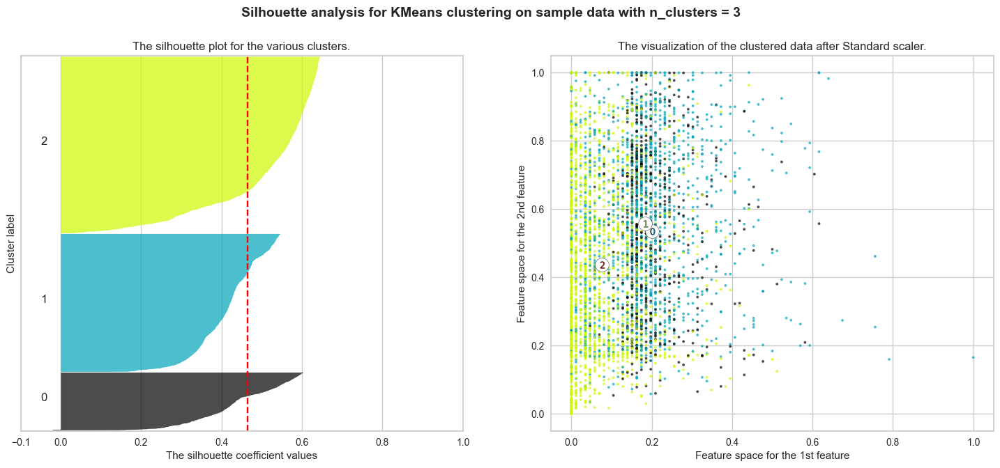

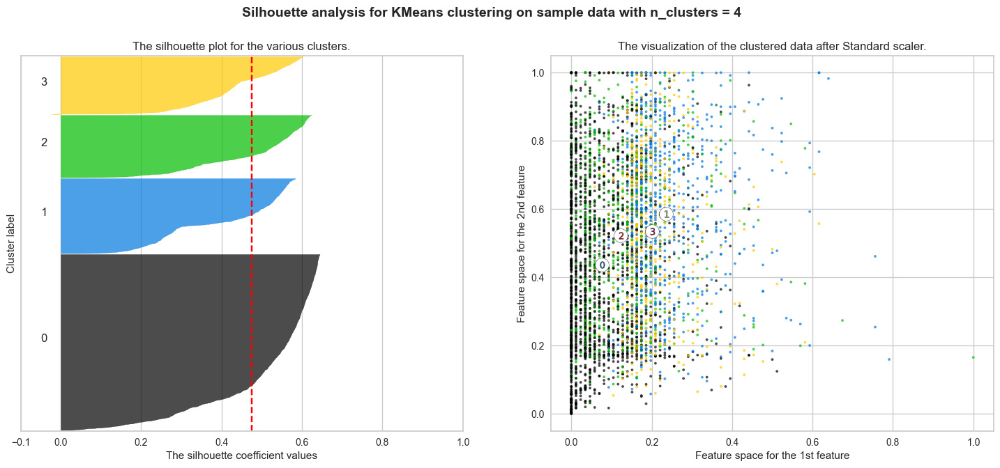

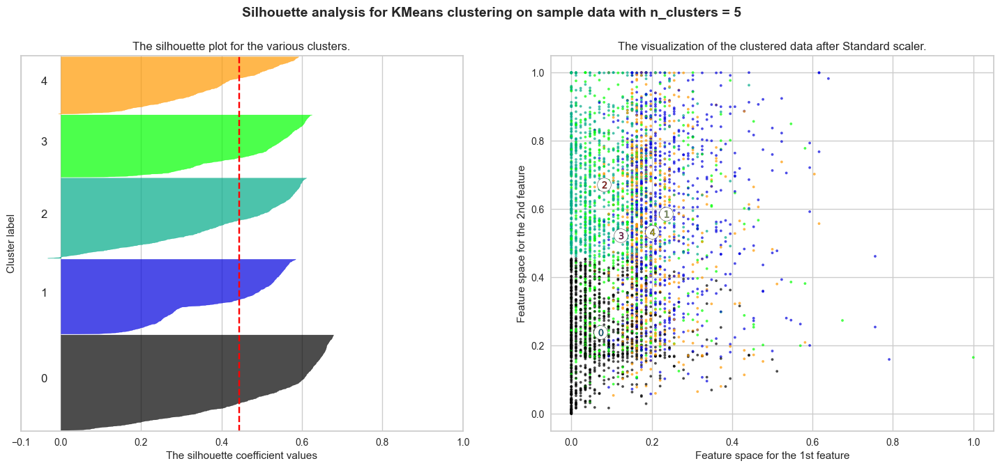

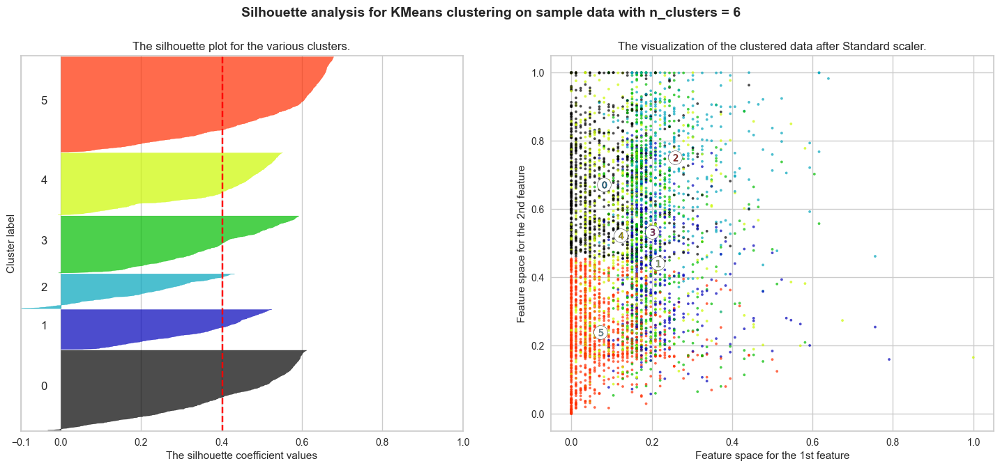

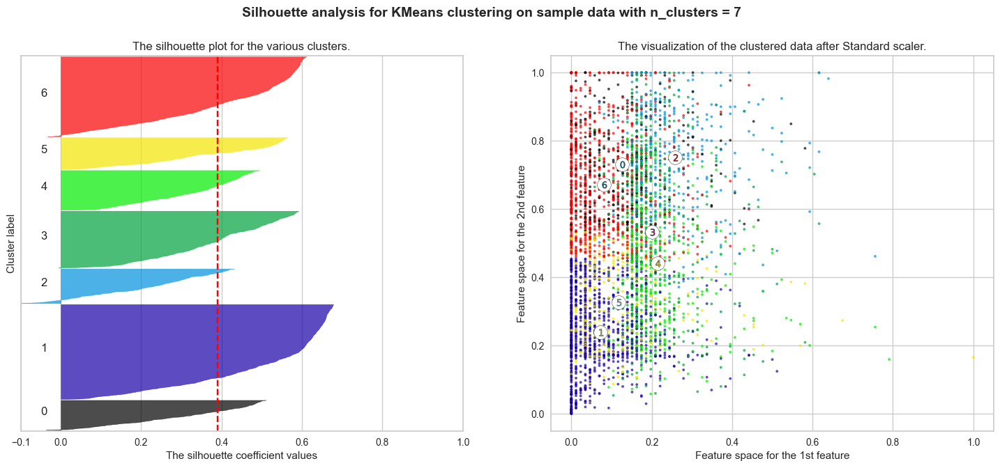

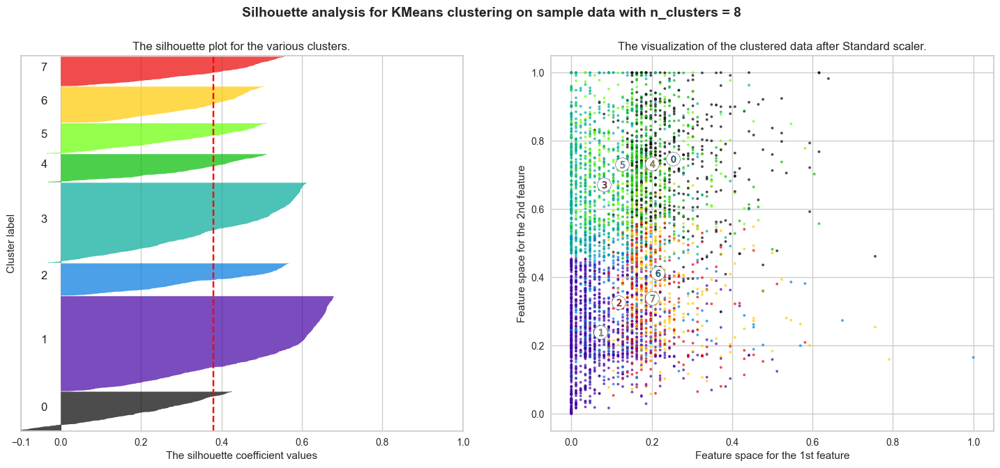

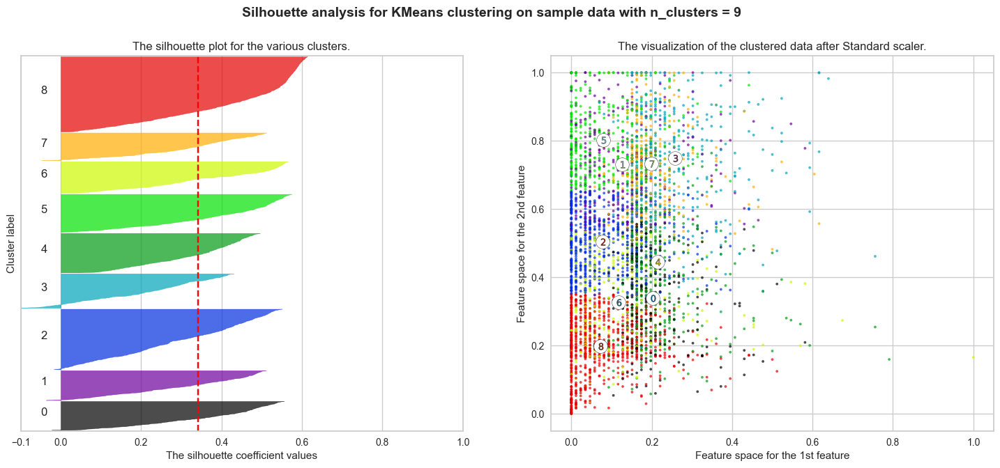

In [74]:
range_n_clusters = [2,3,4,5,6,7,8,9]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(minmax_df) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(minmax_df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = sil(minmax_df, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(minmax_df, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(minmax_df[:,6], minmax_df[:,9], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:,6], centers[:,9], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[6], c[9], marker='$%d$' % i, alpha=1,s=50, edgecolor='k')
        
    ax2.set_title("The visualization of the clustered data after Standard scaler.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

#### Conclusion:
According the the silhouette score of:

The MinMax Scaler Applied data, the ideal number of clusters is 2, with a score higher than other options, of 0.53, but if you notice the number of cluster 5 has also the best variation within cluster and between cluster with zero to no values going towards -1 and no mismatch in cluster segregation than the consecutive rest

If we check silhouette score with Normalize data kmeans model 0.53>0.32. Best score always close to +1.


### So,we build KMeans Cluster algorithm using K=2 and MinMaxScaler Applied Dataset

In [77]:
model_kmeans=KMeans(n_clusters=2,random_state=42,init='k-means++')
y_pred_kmeans=model_kmeans.fit_predict(minmax_df)
y_pred_kmeans

array([1, 1, 1, ..., 0, 1, 1])

In [79]:
y_pred_kmeans.shape

(3998,)

In [80]:
model_kmeans.labels_

array([1, 1, 1, ..., 0, 1, 1])

In [81]:
model_kmeans.cluster_centers_

array([[ 5.69280197e-02,  2.15461508e-02,  4.15428764e-01,
         7.76502363e-03,  4.55773126e-03,  1.09621005e-01,
         1.83518364e-01,  2.78255837e-02,  4.90489598e-02,
         5.57398375e-01,  1.00000000e+00],
       [ 3.50949497e-02,  7.86125463e-03,  1.76400477e-01,
         6.95272149e-03,  2.18514104e-03,  3.88029372e-02,
         1.06355850e-01,  7.34601684e-03,  1.23162495e-02,
         4.60517912e-01, -3.27515792e-15]])

In [82]:
# within-cluster sum of squared

# The lower values of inertia are better and zero is optimal.
# Inertia is the sum of squared error for each cluster. 
# Therefore the smaller the inertia the denser the cluster(closer together all the points are)

model_kmeans.inertia_

823.5583625482057

In [83]:
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
ID,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0
2,19244,0,1,1,1,215,2,0,0,6968,0
3,41354,0,1,1,1,4123,4,0,0,7034,0
4,14776,0,1,1,1,500,1,0,0,6952,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...
4017,18476,0,1,1,1,8525,4,200,1,1403,1
4018,64385,0,1,1,1,981,5,0,0,1395,1
4019,73597,0,3,1,1,25447,8,0,0,1402,1


In [84]:
df['KMeans_Label']=model_kmeans.labels_

In [85]:
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,KMeans_Label
ID,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,1
2,19244,0,1,1,1,215,2,0,0,6968,0,1
3,41354,0,1,1,1,4123,4,0,0,7034,0,1
4,14776,0,1,1,1,500,1,0,0,6952,0,1
5,97752,0,4,1,1,43300,26,2077,4,6935,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4017,18476,0,1,1,1,8525,4,200,1,1403,1,0
4018,64385,0,1,1,1,981,5,0,0,1395,1,0
4019,73597,0,3,1,1,25447,8,0,0,1402,1,0


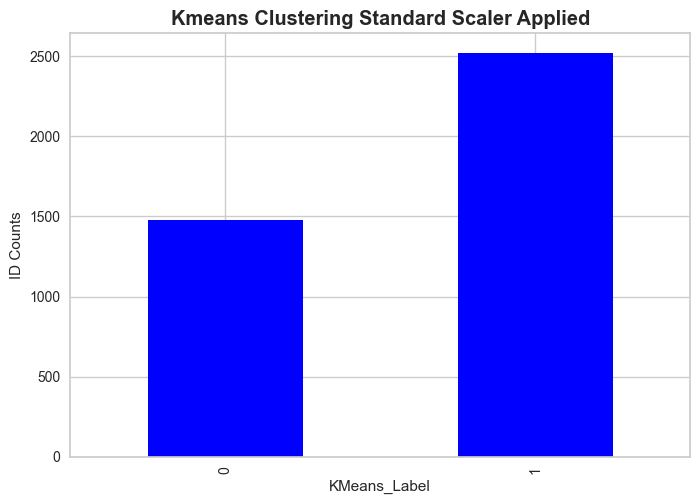

In [116]:

ax=df.groupby(['KMeans_Label']).count().plot(kind='bar',color='Blue',legend=False)
plt.ylabel('ID Counts')
plt.title('Kmeans Clustering Standard Scaler Applied',fontsize='large',fontweight='bold')

plt.show()

In [97]:
# Group data by Clusters (K=2)
df.groupby('KMeans_Label').agg(['mean'])

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
KMeans_Label,,,,,,,,,,,
0,97053.051317,240.196489,2.661715,1.015530,1.018231,28905.414585,15.782579,857.501013,2.599595,4625.062120,1.0
1,59831.203814,87.637267,1.705602,1.013905,1.008741,10231.752483,9.146603,226.382201,0.652761,3821.535558,0.0


In [103]:
df['KMeans_Label']

ID
1       1
2       1
3       1
4       1
5       0
       ..
4017    0
4018    0
4019    0
4020    1
4021    1
Name: KMeans_Label, Length: 3998, dtype: int32

## DBSCAN - (Density Based Spatial Clustering of Applications with Noise)
Why do we need a Density-Based clustering algorithm like DBSCAN when we already have K-means clustering?

K-Means clustering may cluster loosely related observations together. Every observation becomes a part of some cluster eventually, even if the observations are scattered far away in the vector space. Since clusters depend on the mean value of cluster elements, each data point plays a role in forming the clusters.

What’s nice about DBSCAN is that you don’t have to specify the number of clusters to use it. All you need is a function to calculate the distance between values and some guidance for what amount of distance is considered “close”. DBSCAN also produces more reasonable results than k-means across a variety of different distributions

### Density-Based Spatial Clustering of Applications with Noise (DBSCAN) is a base algorithm for density-based clustering. It can discover clusters of different shapes and sizes from a large amount of data, which is containing noise and outliers.

minpts,eps are 2 parameters of DBSCAN

 ### DBSCAN of Standard Scaled Data
To choose the best combination of the algorithm parameters I will first create a matrix of investigated combinations.

In [151]:
from itertools import product

e_values =np.arange(0.50,3,0.50)
# eps values to be investigated
min_samples = np.arange(3,23) 
# min_samples values to be investigated

DBSCAN_params=list(product(e_values,min_samples))
DBSCAN_params


[(0.5, 3),
 (0.5, 4),
 (0.5, 5),
 (0.5, 6),
 (0.5, 7),
 (0.5, 8),
 (0.5, 9),
 (0.5, 10),
 (0.5, 11),
 (0.5, 12),
 (0.5, 13),
 (0.5, 14),
 (0.5, 15),
 (0.5, 16),
 (0.5, 17),
 (0.5, 18),
 (0.5, 19),
 (0.5, 20),
 (0.5, 21),
 (0.5, 22),
 (1.0, 3),
 (1.0, 4),
 (1.0, 5),
 (1.0, 6),
 (1.0, 7),
 (1.0, 8),
 (1.0, 9),
 (1.0, 10),
 (1.0, 11),
 (1.0, 12),
 (1.0, 13),
 (1.0, 14),
 (1.0, 15),
 (1.0, 16),
 (1.0, 17),
 (1.0, 18),
 (1.0, 19),
 (1.0, 20),
 (1.0, 21),
 (1.0, 22),
 (1.5, 3),
 (1.5, 4),
 (1.5, 5),
 (1.5, 6),
 (1.5, 7),
 (1.5, 8),
 (1.5, 9),
 (1.5, 10),
 (1.5, 11),
 (1.5, 12),
 (1.5, 13),
 (1.5, 14),
 (1.5, 15),
 (1.5, 16),
 (1.5, 17),
 (1.5, 18),
 (1.5, 19),
 (1.5, 20),
 (1.5, 21),
 (1.5, 22),
 (2.0, 3),
 (2.0, 4),
 (2.0, 5),
 (2.0, 6),
 (2.0, 7),
 (2.0, 8),
 (2.0, 9),
 (2.0, 10),
 (2.0, 11),
 (2.0, 12),
 (2.0, 13),
 (2.0, 14),
 (2.0, 15),
 (2.0, 16),
 (2.0, 17),
 (2.0, 18),
 (2.0, 19),
 (2.0, 20),
 (2.0, 21),
 (2.0, 22),
 (2.5, 3),
 (2.5, 4),
 (2.5, 5),
 (2.5, 6),
 (2.5, 7),
 (2.5, 8),
 (

In [152]:
no_of_clusters = []
sil_score = []

for p in DBSCAN_params:
    DBS_clustering = DBSCAN(eps=p[0], min_samples=p[1]).fit(std_df)
    no_of_clusters.append(len(np.unique(DBS_clustering.labels_)))
    sil_score.append(silhouette_score(std_df, DBS_clustering.labels_))


In [153]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['No_of_clusters'] = no_of_clusters

tmp

,Eps,Min_samples,No_of_clusters
0,0.5,3,41
1,0.5,4,29
2,0.5,5,17
3,0.5,6,14
4,0.5,7,17
...,...,...,...
95,2.5,18,3
96,2.5,19,3
97,2.5,20,3
98,2.5,21,2


In [154]:
pivot_1 = pd.pivot_table(tmp, values='No_of_clusters', index='Min_samples', columns='Eps')
pivot_1


Eps,0.5,1.0,1.5,2.0,2.5
Min_samples,,,,,
3,41,11,10,13,6
4,29,9,7,9,4
5,17,7,6,7,4
6,14,6,5,7,4
7,17,6,5,6,4
8,12,4,5,5,4
9,11,4,4,5,5
10,10,4,4,4,5
11,10,3,4,4,4


A heatplot below shows how many clusters were genreated by the algorithm for the respective parameters combinations.


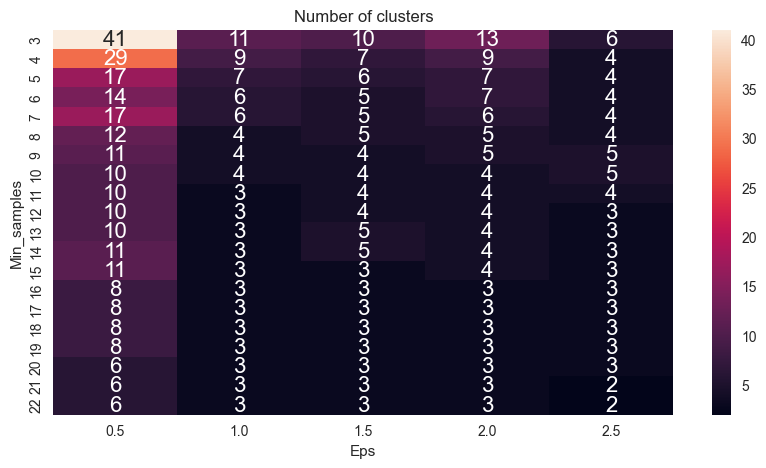

In [155]:
fig, ax = plt.subplots(figsize=(10,5))
sn.heatmap(pivot_1, annot=True,annot_kws={"size": 16}, ax=ax)
ax.set_title('Number of clusters')
print('A heatplot below shows how many clusters were genreated by the algorithm for the respective parameters combinations.')
plt.show()

##### As the heatplot above shows that ,the no. of clusters are vary from 41 to 2.

In [159]:
tmp1 = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp1['Sil_score'] = sil_score

pivot_2 = pd.pivot_table(tmp1, values='Sil_score', index='Min_samples', columns='Eps')
pivot_2



Eps,0.5,1.0,1.5,2.0,2.5
Min_samples,,,,,
3,-0.114633,0.093781,0.212458,0.245650,0.526048
4,-0.100486,0.135878,0.250052,0.252375,0.541948
5,-0.078477,0.198355,0.253666,0.253682,0.542480
6,-0.081551,0.218810,0.252545,0.258415,0.543083
7,-0.110025,0.196908,0.252298,0.260925,0.543267
8,-0.094671,0.221853,0.250310,0.259954,0.544448
9,-0.106183,0.220134,0.246734,0.259472,0.509086
10,-0.098491,0.218382,0.246159,0.255387,0.508438
11,-0.106176,0.217926,0.245971,0.255327,0.545165


In [160]:
tmp1

,Eps,Min_samples,Sil_score
0,0.5,3,-0.114633
1,0.5,4,-0.100486
2,0.5,5,-0.078477
3,0.5,6,-0.081551
4,0.5,7,-0.110025
...,...,...,...
95,2.5,18,0.541210
96,2.5,19,0.541206
97,2.5,20,0.540019
98,2.5,21,0.631888


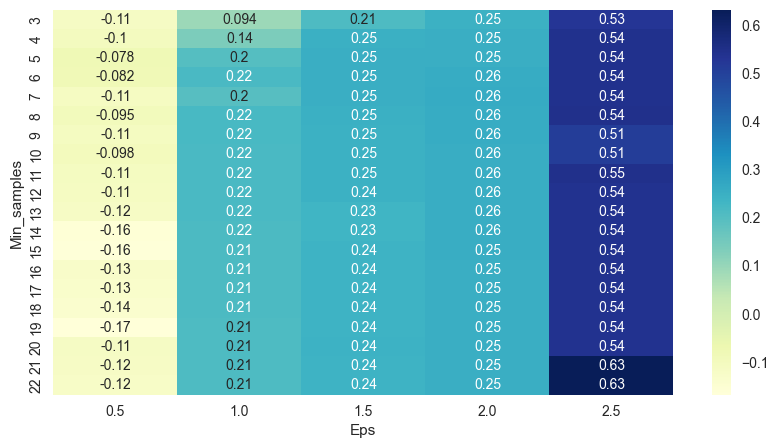

In [162]:
fig, ax = plt.subplots(figsize=(10,5))
sn.heatmap(pivot_2, annot=True, annot_kws={"size": 10}, cmap="YlGnBu", ax=ax)
plt.show()

#### Global maximum is 0.63 for eps=2.5 and min_samples=21 and 22

In [163]:
dbscan = DBSCAN(eps=2.5, min_samples=21)
dbscan.fit(std_df)

DBSCAN(eps=2.5, min_samples=21)

In [164]:
dbscan.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [165]:
# -1 are the noise points in our dataset and the rest are the clusters
# Concating Labels with main dataset copy

df['DBSCAN_labels'] = dbscan.labels_
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,KMeans_Label,Hierarchical_labels,DBSCAN_labels
ID,,,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,1,0,0
2,19244,0,1,1,1,215,2,0,0,6968,0,1,0,0
3,41354,0,1,1,1,4123,4,0,0,7034,0,1,0,0
4,14776,0,1,1,1,500,1,0,0,6952,0,1,0,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4017,18476,0,1,1,1,8525,4,200,1,1403,1,0,1,0
4018,64385,0,1,1,1,981,5,0,0,1395,1,0,1,0
4019,73597,0,3,1,1,25447,8,0,0,1402,1,0,1,0


In [166]:
df.groupby('DBSCAN_labels').agg(['mean'])

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,KMeans_Label,Hierarchical_labels
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
DBSCAN_labels,,,,,,,,,,,,,
-1,211990.889423,1522.576923,2.509615,1.278846,1.235577,45335.081731,24.754808,3276.389423,9.548077,4768.596154,0.687500,0.312500,0.687500
0,66025.489182,68.500792,2.035092,1.000000,1.000000,15602.254090,10.883113,305.613193,0.925330,4083.549868,0.353034,0.646966,0.353034


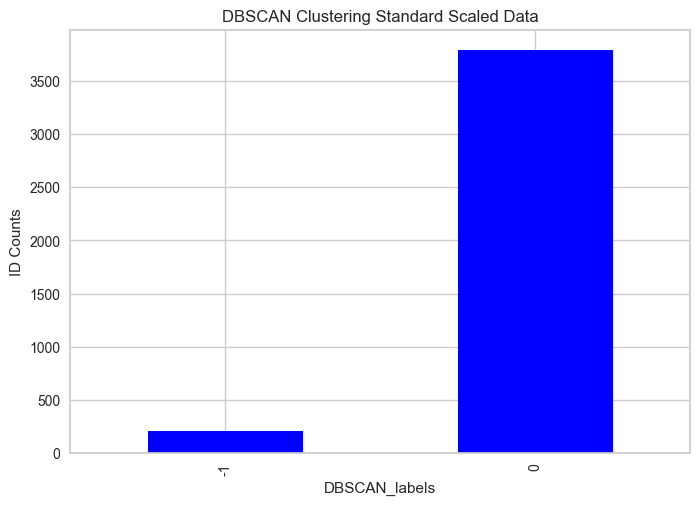

In [168]:
# Plotting barplot using groupby method to get visualize how many row no. in each cluster

df.groupby(['DBSCAN_labels']).count().plot(kind='bar',color='Blue',legend=False)
plt.ylabel('ID Counts')
plt.title('DBSCAN Clustering Standard Scaled Data')
plt.show()

## DBSCAN on MinMax Scaled Data

In [170]:
from itertools import product

eps_values = np.arange(0.25,1.25,0.25) # eps values to be investigated
min_samples = np.arange(3,23) # min_samples values to be investigated
DBSCAN_params = list(product(eps_values, min_samples))


In [171]:
no_of_clusters = []
sil_score = []

for p in DBSCAN_params:
    DBS_clustering = DBSCAN(eps=p[0], min_samples=p[1]).fit(minmax_df)
    no_of_clusters.append(len(np.unique(DBS_clustering.labels_)))
    sil_score.append(silhouette_score(minmax_df, DBS_clustering.labels_))


Eps          0.25  0.50  0.75  1.00
Min_samples                        
3              18     8     2     2
4              14     8     2     2
5              14     8     2     2
6              13     7     2     2
7              13     6     2     2
8              12     6     2     2
9              12     6     3     2
10             12     4     3     2
11             12     4     3     2
12             12     4     3     2
13             11     4     3     2
14             11     4     3     2
15             11     4     3     2
16             11     4     3     2
17             11     3     3     2
18             11     3     3     2
19             11     3     3     2
20             11     3     3     2
21             11     3     3     2
22             11     3     3     2
A heatplot below shows how many clusters were genreated by the algorithm for the respective parameters combinations.


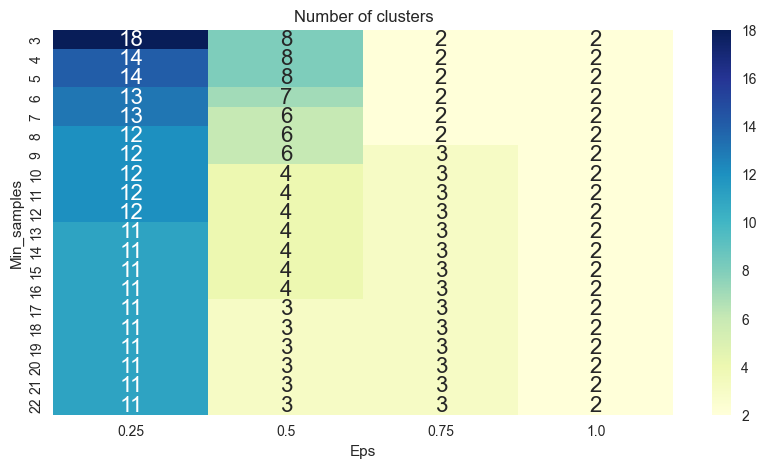

In [184]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['No_of_clusters'] = no_of_clusters

pivot_1 = pd.pivot_table(tmp, values='No_of_clusters', index='Min_samples', columns='Eps')
print(pivot_1)

fig, ax = plt.subplots(figsize=(10,5))
sn.heatmap(pivot_1, annot=True,annot_kws={"size": 16}, cmap="YlGnBu", ax=ax)
ax.set_title('Number of clusters')
print('A heatplot below shows how many clusters were genreated by the algorithm for the respective parameters combinations.')
plt.show()

#### As the heatplot above shows, the number of clusters vary from 18 to 2.

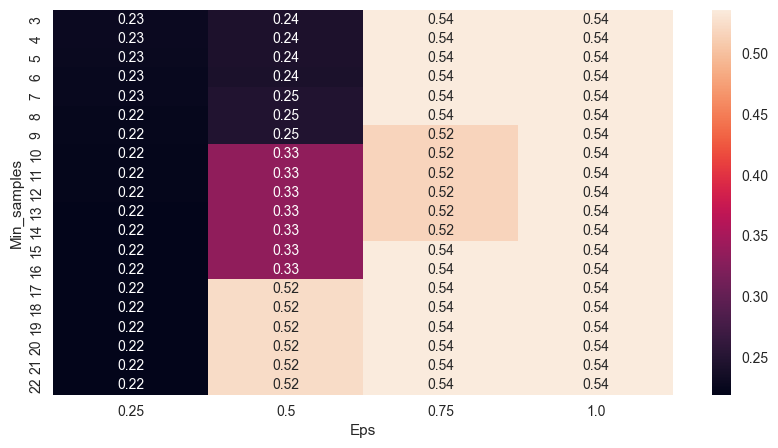

In [187]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['Sil_score'] = sil_score

pivot_1 = pd.pivot_table(tmp, values='Sil_score', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(10,5))
sn.heatmap(pivot_1, annot=True, annot_kws={"size": 10}, ax=ax)
plt.show()

#### Global maximum is 0.54 for eps=1.0 and min_samples=from 22 to 3 

In [189]:
#Run DBSCAN on MinMax Scaled data with optimal min_sample and epsilon values
dbscan = DBSCAN(eps=1, min_samples=22) # min_samples = number of clumns * 3
dbscan.fit(minmax_df)


DBSCAN(eps=1, min_samples=22)

In [190]:
dbscan.labels_
# -1 are the noise points in our dataset and the rest are the clusters


array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [191]:
# Concating Labels with main dataset copy

df['DBSCAN_labels1'] = dbscan.labels_
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,KMeans_Label,Hierarchical_labels,DBSCAN_labels,DBSCAN_labels1
ID,,,,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,1,0,0,0
2,19244,0,1,1,1,215,2,0,0,6968,0,1,0,0,0
3,41354,0,1,1,1,4123,4,0,0,7034,0,1,0,0,0
4,14776,0,1,1,1,500,1,0,0,6952,0,1,0,0,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4017,18476,0,1,1,1,8525,4,200,1,1403,1,0,1,0,1
4018,64385,0,1,1,1,981,5,0,0,1395,1,0,1,0,1
4019,73597,0,3,1,1,25447,8,0,0,1402,1,0,1,0,1


In [192]:
df.groupby('DBSCAN_labels1').agg(['mean'])


,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,KMeans_Label,Hierarchical_labels,DBSCAN_labels
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
DBSCAN_labels1,,,,,,,,,,,,,,
0,59831.203814,87.637267,1.705602,1.013905,1.008741,10231.752483,9.146603,226.382201,0.652761,3821.535558,0.0,1.0,0.0,-0.025824
1,97053.051317,240.196489,2.661715,1.015530,1.018231,28905.414585,15.782579,857.501013,2.599595,4625.062120,1.0,0.0,1.0,-0.096556


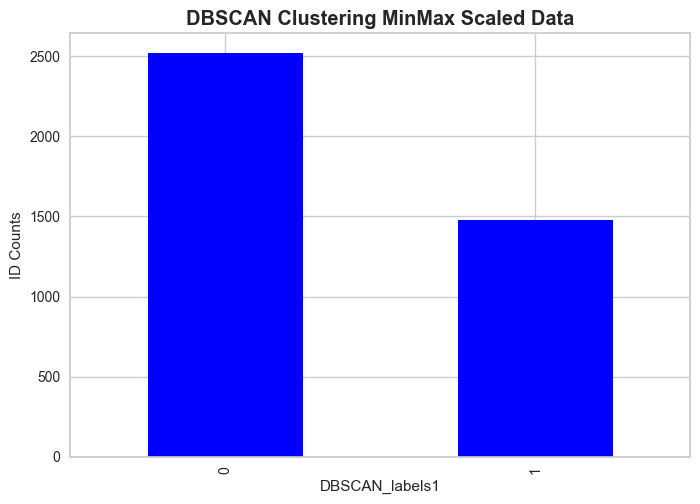

In [193]:
# Plotting barplot using groupby method to get visualize how many row no. in each cluster

df.groupby(['DBSCAN_labels1']).count().plot(kind='bar',legend=False,color='Blue')
plt.ylabel('ID Counts')
plt.title('DBSCAN Clustering MinMax Scaled Data',fontsize='large',fontweight='bold')
ax.set_xlabel('Clusters', fontsize='large', fontweight='bold')
ax.set_ylabel('ID counts', fontsize='large', fontweight='bold')
plt.show()

In [195]:
# Sorting elements based on cluster label assigned and taking average for insights.

cluster1 = pd.DataFrame(df.loc[df.DBSCAN_labels1==0].mean(),columns= ['Cluster1_avg'])
cluster2 = pd.DataFrame(df.loc[df.DBSCAN_labels1==1].mean(),columns= ['Cluster2_avg'])
avg_df = pd.concat([cluster1,cluster2],axis=1)
avg_df

,Cluster1_avg,Cluster2_avg
Balance,59831.203814,97053.051317
Qual_miles,87.637267,240.196489
cc1_miles,1.705602,2.661715
cc2_miles,1.013905,1.015530
cc3_miles,1.008741,1.018231
Bonus_miles,10231.752483,28905.414585
Bonus_trans,9.146603,15.782579
Flight_miles_12mo,226.382201,857.501013
Flight_trans_12,0.652761,2.599595
Days_since_enroll,3821.535558,4625.062120


In [200]:
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,KMeans_Label,Hierarchical_labels,DBSCAN_labels,DBSCAN_labels1
ID,,,,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,1,0,0,0
2,19244,0,1,1,1,215,2,0,0,6968,0,1,0,0,0
3,41354,0,1,1,1,4123,4,0,0,7034,0,1,0,0,0
4,14776,0,1,1,1,500,1,0,0,6952,0,1,0,0,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4017,18476,0,1,1,1,8525,4,200,1,1403,1,0,1,0,1
4018,64385,0,1,1,1,981,5,0,0,1395,1,0,1,0,1
4019,73597,0,3,1,1,25447,8,0,0,1402,1,0,1,0,1


### Conclusion :

As decided need to focous on first two clusters.

Considering past Award status(0 or 1) cluster number2 shows award avg as 1 that means people awarded with scheme. Similarly for cluster number 2 award avg. is 0. 

Since avg is low that means now maximim award given to cluster number1 in the past. Need to add future schemes for cluster number two members on different bonus points & different card transaction bonus.

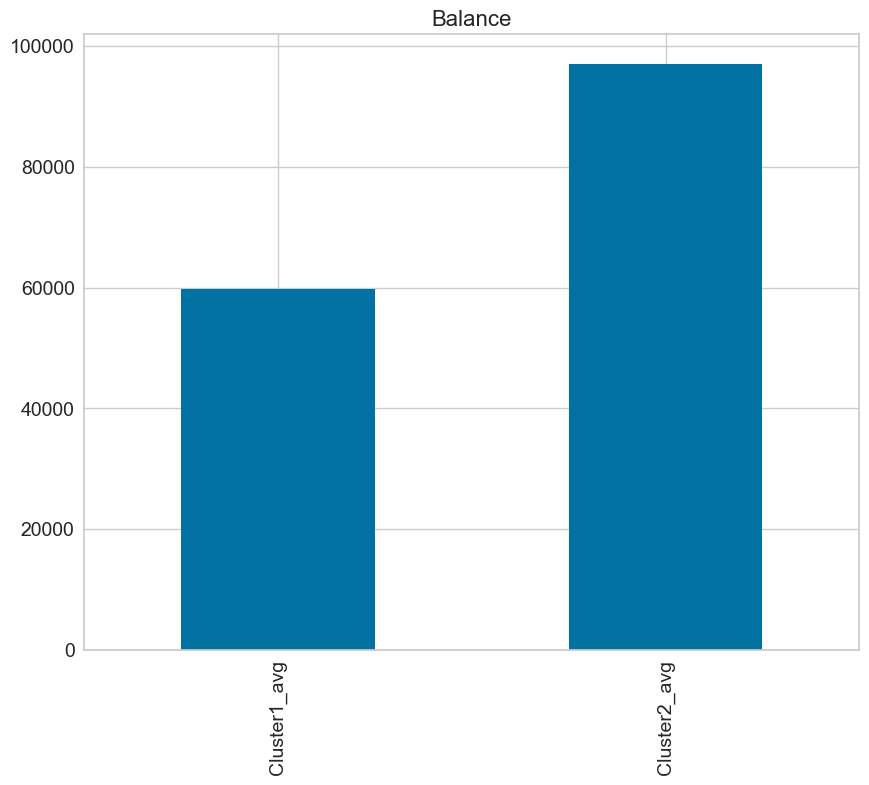

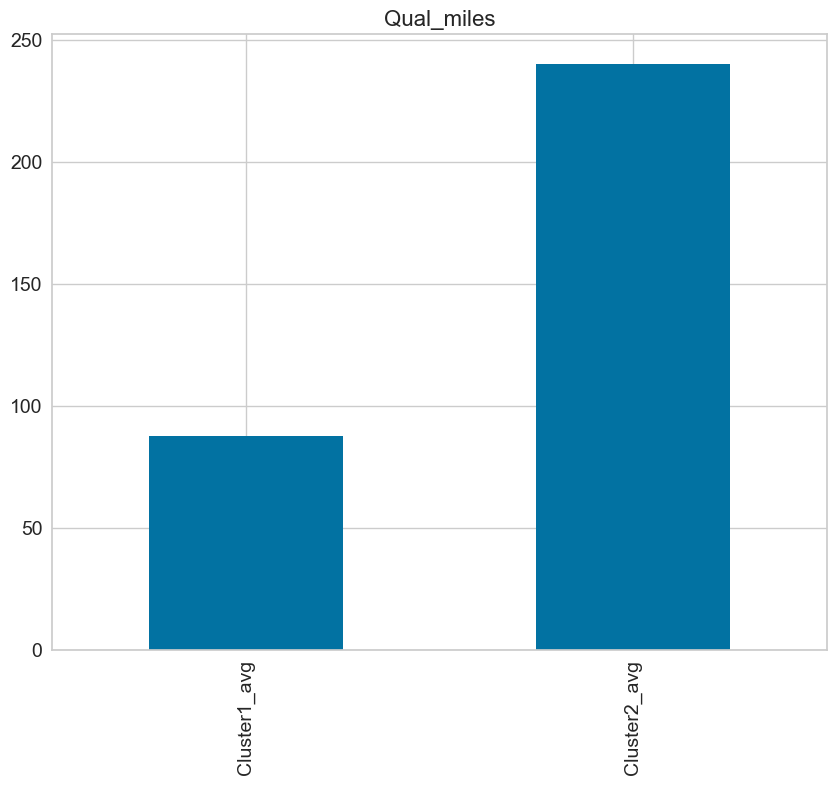

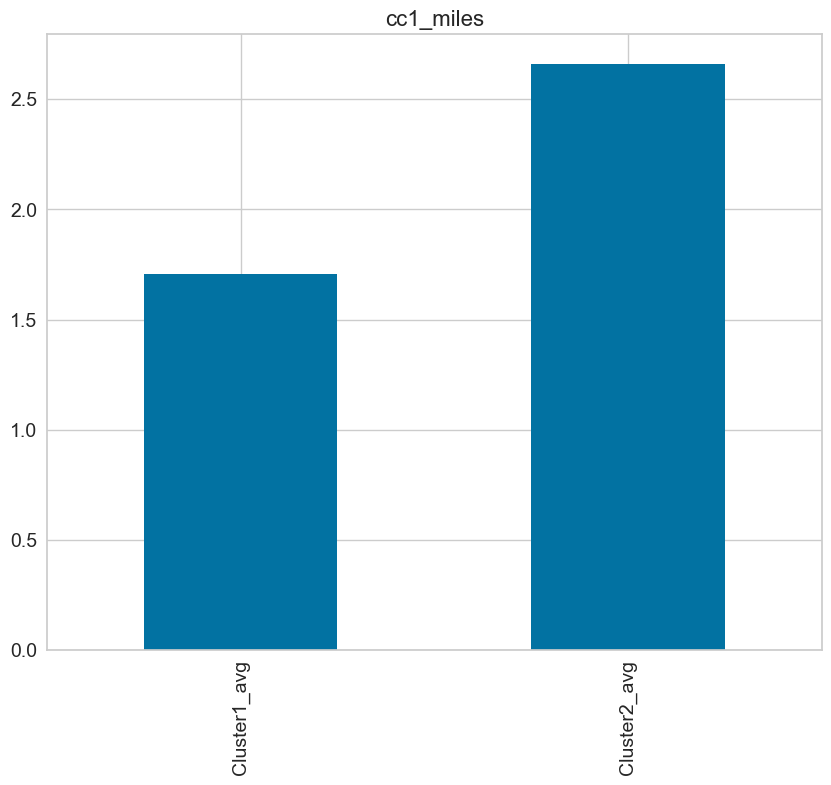

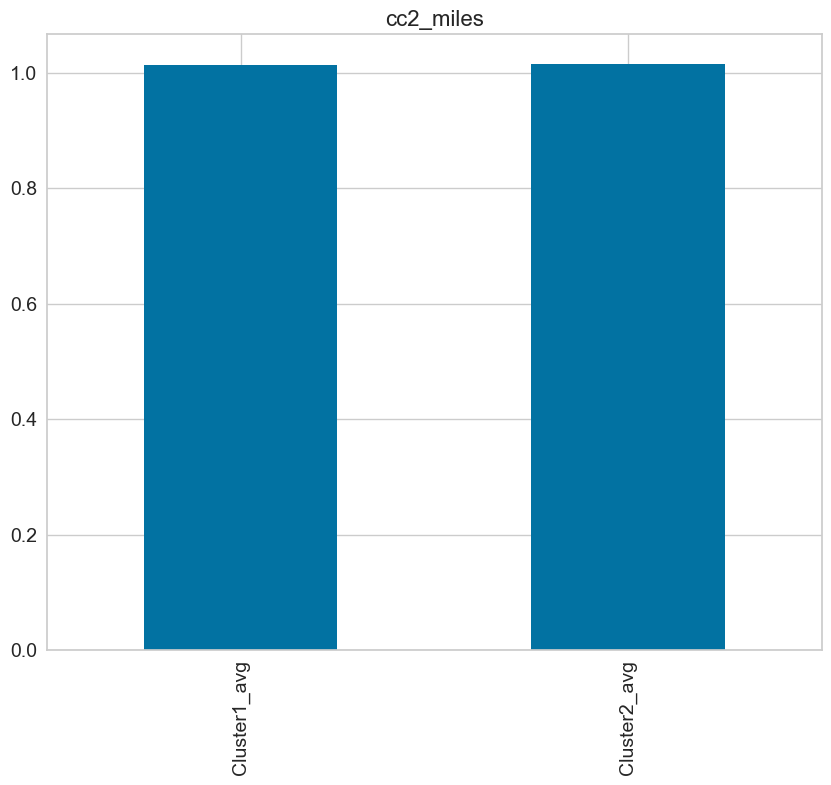

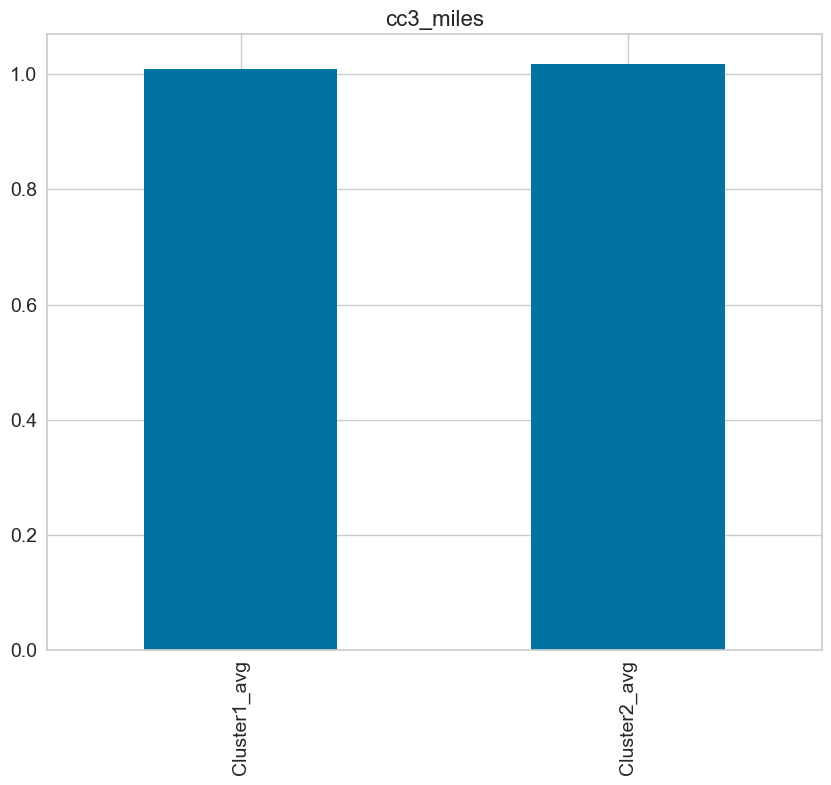

...

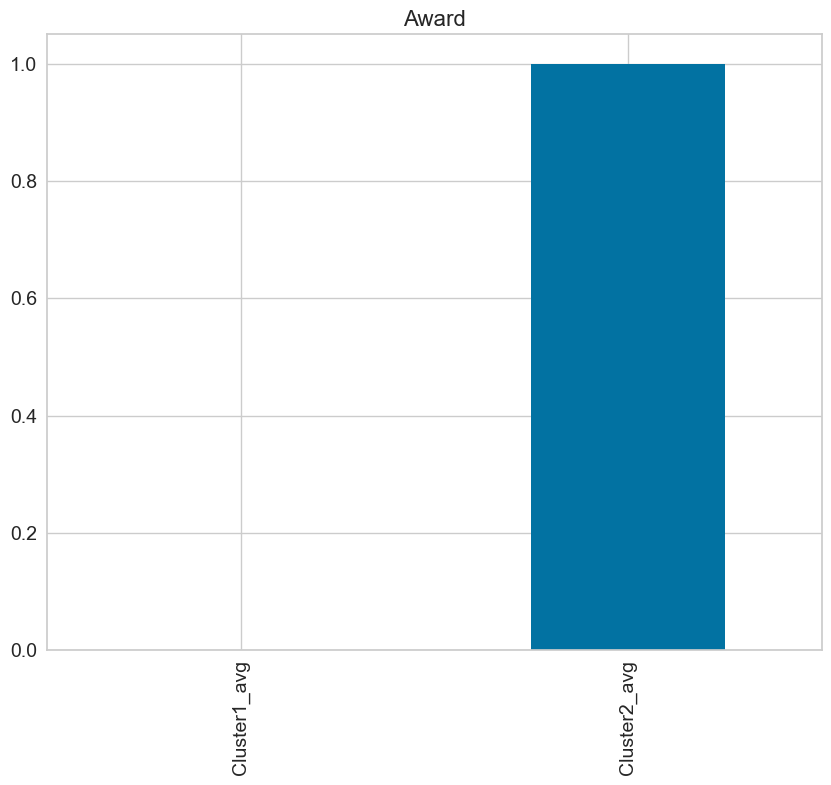

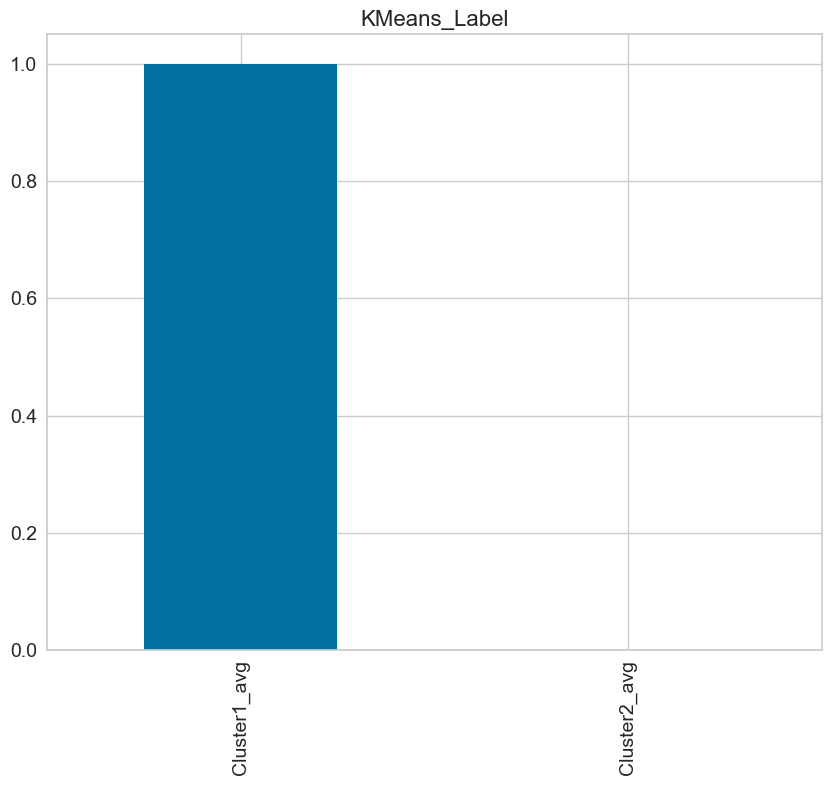

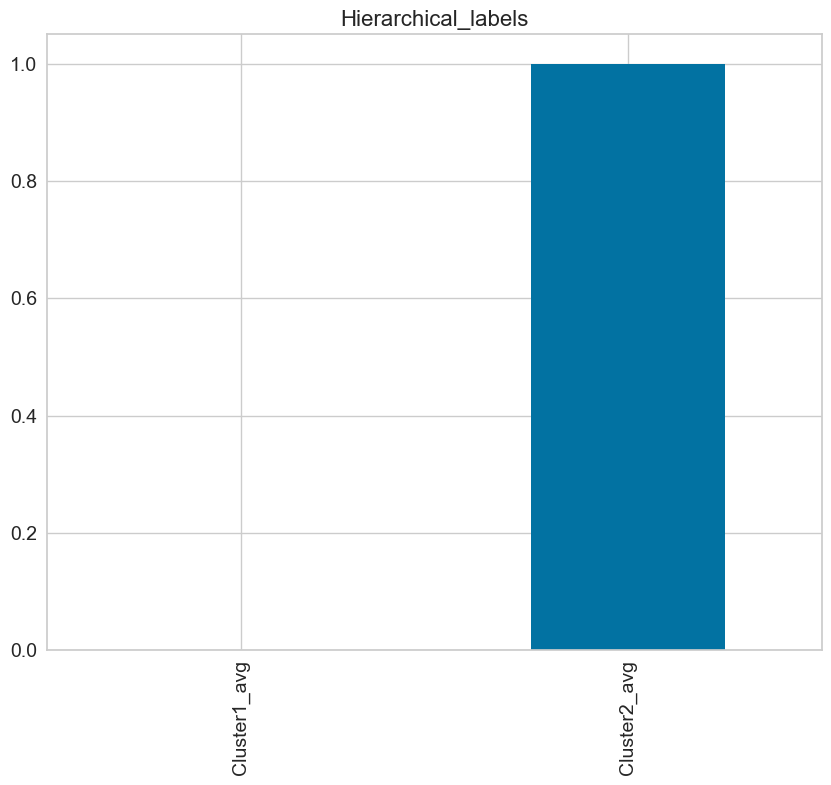

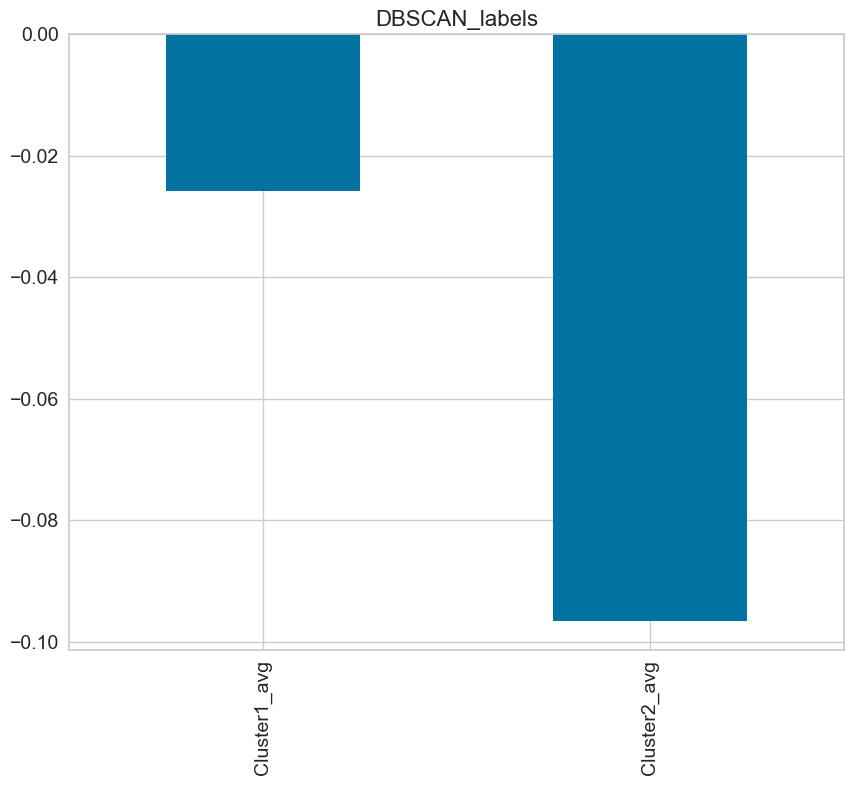

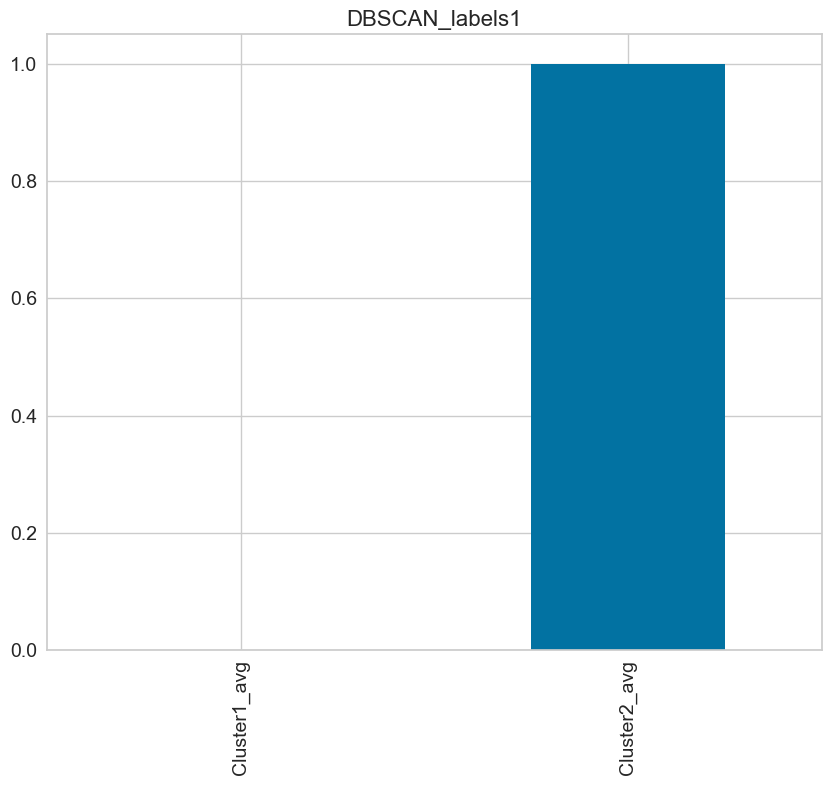

In [201]:
# Extract and plot one Column data .xs method
for i , row in avg_df.iterrows():
    fig = plt.subplots(figsize=(10,8))
    j = avg_df.xs(i ,axis = 0)
    plt.title(i, fontsize=16, fontweight=20)
    j.plot(kind='bar',fontsize=14)
    plt.show()
    print()

## Conclusion:
So,we applied EDA to analyze dataset.

Discovered correlation between diff variables and found colinearity.

Applied Standardazation & MinMaxScalar transformation on the data to use Principle componets analysis effectively.

We used & analyzed two clustering techniques here..
i) KMeans ii) Hierarchical Clusterig  iii) DBSCAN.

By applying clustering on diff. PCA obtained with diff transformation data shows fluctuation in model score. 

#### So finally the Standard Scaler found less score so not used for further model building.
KMeans clustering is sensitive to outliers